| Scenario | Adaptation | Purpose |
|----------|------------|---------|
| 1 | — | No shocks, no adaptation (baseline) |
| 2 | 0 = off | Shocks only, no adaptation |
| 3 | 2 = Recovery | Shocks + recovery adaptation |
| 4 | 1 = Protection | Shocks + protection adaptation |
| 5 | 3 = Both | Shocks + full adaptation |

This notebook presents results of R-DSK for stylised Italy

In [183]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import geopandas as gpd
import sys
from scipy.stats import beta
import requests
from matplotlib.colors import ListedColormap
import importlib
from scipy.stats import beta as beta_dist
import seaborn as sns

import json
import plotly.express as px
import plotly.graph_objects as go

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [184]:

# Load reusable reader from scripts/read_batch_runs.py
project_root = Path.cwd()
if not (project_root / "scripts").exists():
    project_root = project_root.parent
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

In [185]:
import scripts.read_batch_runs as _rbr
importlib.reload(_rbr)

from scripts.read_batch_runs import (
    load_simulation_results_matrix,
    check_regional_consistency,
)
from scripts.visualise_shocks import *
from scripts.compute_macros import *
from scripts.lineplots import *

In [186]:
# Set path for output figures
OUTPUT = Path("/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/")
OUTPUT.mkdir(parents=True, exist_ok=True)

# define paths to experiment runs.
PATHS = {
    'scenario' : Path("/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/Italy_Baseline"),
    # 'Protection' : Path("/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/protection/SmallMoreExposed"),
    }

## Methods

In [187]:
def plot_split_violinplot(scenario_results, metric,
    metric_label = '',
    region = 'macro',
    tmin = 200,
    scenario_mapper = {
        1: 'No Shock',
        2: 'CS',
        3: 'LP+EF'
    },
    palette=None
    ):
    """Plot split violin for paired scenarios (_1 vs _2, etc.) using Seaborn."""
            
    if metric_label == '':
        metric_label = metric.replace('_', ' ')
    # compute metric values for each scenario
    metric_df = []
    for scenario in scenario_results.keys():
        if type(region) == str:
            temp_df = scenario_results[scenario][scenario_results[scenario]['region']==region].copy()
        elif type(region) == list:
            temp_df = scenario_results[scenario][scenario_results[scenario]['region'].isin(region)].copy()
        temp_df = temp_df[temp_df['t']>tmin].copy()
        temp_df.loc[:,'shock'] = temp_df['scenario'].replace(scenario_mapper)
        temp_df['scenario_name'] = scenario.split('_')[0]
        metric_df.append(temp_df.groupby(['run', 'scenario_name', 'shock'])[metric].mean().reset_index())

    # concatenate metric values into a single DataFrame
    metric_df = pd.concat(metric_df, ignore_index=True)
    metric_df.reset_index(drop=True, inplace=True)

    # Draw a nested violinplot and split the violins for easier comparison
    sns.violinplot(
        data=metric_df,
        x=metric,             
        y="shock",             
        hue="scenario_name",
        split=True,
        inner="quart",
        fill=False,
        palette=palette,
    )

    # turn off x-axis labels (now metric axis)
    plt.xlabel(metric_label) 
    # Turn off the legend title
    # position legend outside the plot below x axis label
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3, facecolor='white', title="", frameon=False)
    # set y-axis label (now categorical axis)
    plt.ylabel("")            

    # change background color
    plt.gca().set_facecolor("#ffffff")

    # add gridlines (now along x-axis)
    plt.grid(True, axis="x", alpha=0.36, color='gray',
            linestyle='--', linewidth=0.5, which='major')

    # set figure size and resolution (optional tweak for horizontal layout)
    plt.gcf().set_size_inches(10, 5)  
    plt.savefig(OUTPUT / f"{metric}_violinplot.png", bbox_inches="tight", dpi=300)
    plt.show()


def plot_regional_split_violin(metric,
    metric_label = '',
    tmin = 200,
    scenario_mapper = {
        1: 'No Shock',
        2: 'CS',
        3: 'LP+EF'
    },
    palette = None):

    if metric_label == '':
        metric_label = metric.replace('_', ' ')

    # --- Collect all regions across scenarios (robust) ---
    all_regions = set()
    for s in scenario_results:
        all_regions.update(scenario_results[s]['region'].unique())

    regions = [r for r in all_regions if r != 'macro'][::-1]

    # --- Compute metric values ---
    metric_df = []

    for scenario in scenario_results.keys():
        temp_df = scenario_results[scenario].copy()

        # filter regions + time
        temp_df = temp_df[temp_df['region'].isin(regions)]
        temp_df = temp_df[temp_df['t'] > tmin]

        # map labels
        temp_df['shock'] = temp_df['scenario'].replace(scenario_mapper)
        temp_df['scenario_name'] = scenario.split('_')[0]

        # group and aggregate
        grouped = (
            temp_df
            .groupby(['run', 'scenario_name', 'shock', 'region'])[metric]
            .mean()
            .reset_index()
        )

        metric_df.append(grouped)

    # --- Final DataFrame ---
    metric_df = pd.concat(metric_df, ignore_index=True)
    metric_df.reset_index(drop=True, inplace=True)



    g = sns.catplot(
        data=metric_df,
        x="shock",
        y=metric,
        hue="scenario_name",
        col="region",
        kind="violin",
        split=True,
        inner="quart",
        height=4,
        aspect=0.8,
        sharey=True,
        legend=False,
        palette=palette,
        fill=False,
    )

    # set face color white and add gridlines
    for ax in g.axes.flatten():
        ax.set_facecolor("#ffffff")
        ax.grid(True, axis="y", alpha=0.36, color='gray', linestyle='--', linewidth=0.5, which='major')

    g.set_axis_labels("", metric_label)
    g.set_titles("Region {col_name}")

    # --- enforce consistent order ---
    hue_order = list(palette.keys())

    # --- build legend using SAME palette ---
    handles = [
        Patch(facecolor=palette[name], label=name)
        for name in hue_order
    ]

    # --- add figure-level legend ---
    g.fig.legend(
        handles=handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 1),
        ncol=len(handles),
        frameon=False,
        title=""
    )

    # --- adjust layout ---
    g.fig.subplots_adjust(top=0.82)

    # change figure size and save
    g.fig.set_size_inches(10, 6)
    g.fig.savefig(OUTPUT / f"{metric}_violinplot_by_region.png", bbox_inches="tight", dpi=300)

    plt.show()

## Read simulation results

In [188]:
# load simulation result matrices
sim_matrix = {}
for PATH in PATHS.keys():
    sim_matrix[PATH] = load_simulation_results_matrix(PATHS[PATH])

Found 5 scenario candidate folders under /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/Italy_Baseline
Scenario 1: run_folders=50, max_run=50, macro_files_loaded=50, region_files_loaded=150, max_region=3, shock_files_loaded=0
  Scenario 1: saved to scenario_1.csv.gz
Column count mismatch: data_cols=76, yaml_cols=83.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=76, yaml_cols=83.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=76, yaml_cols=83.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=50, yaml_cols=55.
Column count mismatch: data_cols=76, yaml_cols=83.
Column count mismatch: data_cols=50, yaml_cols=55.
Column co

In [189]:
# Extract simulation results
scenario_results = {}
for sim in sim_matrix.keys():
    for scenario_num in sim_matrix[sim].scenario.unique():
        scenario_results[f"{sim}_{scenario_num}"] = sim_matrix[sim].loc[sim_matrix[sim].scenario == scenario_num]
        

## Set color map and region index

In [190]:
scenario_results['scenario_1']['region'].unique()

array(['macro', 2, 1, 3], dtype=object)

In [191]:
region_index = {1: 'L', 2: 'M', 3: 'S'}

In [192]:
# Get IBM design colour pallette for plotting 3 regions and map to region names
cmap = ListedColormap(px.colors.qualitative.Plotly[:5])
region_colour_map = {
    "L": cmap(0),  # Large Region
    "M": cmap(1),  # Medium Region
    "S": cmap(2),  # Small Region
}

## Choropleth

## Beta Distributions

In [193]:
df = scenario_results['scenario_2']

# Get shock parameters for flood and heatwave shocks for each region averaged across all runs
df_shocks = df.groupby(["t", "region"])[['X_a_1', 'X_b_1', 'X_a_6', 'X_b_6']].mean().reset_index()

df_shocks.region = df_shocks.region.replace(region_index)

In [194]:

from matplotlib.colors import to_hex

# Color / name mapping consistent with the rest of the notebook
# to_hex() converts the RGBA tuple from cmap(i) to a "#rrggbb" hex string
# that is accepted by both Plotly and the hex-parsing in plot_shock_magnitude.
region_meta = {
    "L": {"name": "Large", "color": to_hex(cmap(0))},
    "M": {"name": "Medium", "color": to_hex(cmap(1))},
    "S": {"name": "Small",    "color": to_hex(cmap(2))},
}

x = np.linspace(1e-4, 0.15, 500)   # damage fraction [0%, 15%]

# Prepare data
df_b = df_shocks[df_shocks["region"] != "macro"].copy()
time_steps = sorted(df_b["t"].unique())

sampled_ts = [t for t in time_steps if 200 <= t <= 600 and t % 50 == 0]

# channels: 1=heatwave, 6=flood
channels = [
    ("Heatwave",    "X_a_1", "X_b_1"),
    ("Floods", "X_a_6", "X_b_6"),
]

# --- Compute per-channel y-axis ceiling ---
y_max_per_channel = [0.0, 0.0]
for t_val in sampled_ts:
    df_t = df_b[df_b["t"] == t_val].set_index("region")
    for ci, (_, a_col, b_col) in enumerate(channels):
        for reg in region_meta:
            if reg not in df_t.index:
                continue
            pdf_vals = beta_dist.pdf(x, float(df_t.loc[reg, a_col]), float(df_t.loc[reg, b_col]))
            y_max_per_channel[ci] = max(y_max_per_channel[ci], pdf_vals.max())

y_range_1 = [0, y_max_per_channel[0] * 1.05]   # 5 % headroom for channel 0
y_range_2 = [0, y_max_per_channel[1] * 1.05]   # 5 % headroom for channel 1

def _pdf_traces(t_val):
    df_t = df_b[df_b["t"] == t_val].set_index("region")
    traces = []
    for ci, (_, a_col, b_col) in enumerate(channels):
        for reg, meta in region_meta.items():
            if reg not in df_t.index:
                continue
            a_v = float(df_t.loc[reg, a_col])
            b_v = float(df_t.loc[reg, b_col])
            pdf = beta_dist.pdf(x, a_v, b_v)
            traces.append(go.Scatter(
                x=x, y=pdf, mode="lines",
                name=f"{reg} - {meta['name']}",
                line=dict(color=meta["color"], width=2),
                legendgroup=reg,
                showlegend=(ci == 0),
                xaxis="x"  if ci == 0 else "x2",
                yaxis="y"  if ci == 0 else "y2",
            ))
    return traces

init_traces = _pdf_traces(sampled_ts[0])

frames = [
    go.Frame(
        data=_pdf_traces(t),
        name=str(t),
        layout=go.Layout(title_text=f"Beta Damage Distributions - t = {t}"),
    )
    for t in sampled_ts
]

fig = go.Figure(data=init_traces, frames=frames)

_axis_common = dict(showgrid=True, gridcolor="lightgray", gridwidth=1, zeroline=False)

fig.update_layout(
    title=dict(
        text=f"Beta Damage Distributions - t = {sampled_ts[0]}",
        font=dict(size=16),
    ),
    plot_bgcolor="white",
    width=1100, height=520,
    xaxis=dict(domain=[0, 0.44], title="Damage fraction", tickformat=".0%", range=[0, 0.15], **_axis_common),
    yaxis=dict(title="Probability density", range=y_range_1, fixedrange=True, **_axis_common),
    xaxis2=dict(domain=[0.56, 1.0], title="Damage fraction", tickformat=".0%", range=[0, 0.15], anchor="y2", **_axis_common),
    yaxis2=dict(title="Probability density", anchor="x2", range=y_range_2, fixedrange=True, **_axis_common),
    annotations=[
        dict(text="<b>Heatwave</b>",    x=0.22, y=1.08, xref="paper", yref="paper", showarrow=False, font=dict(size=14)),
        dict(text="<b>Floods</b>", x=0.78, y=1.08, xref="paper", yref="paper", showarrow=False, font=dict(size=14)),
    ],
    legend=dict(orientation="h", yanchor="bottom", y=-0.55, xanchor="center", x=0.5, font=dict(size=11)),
    updatemenus=[{
        "buttons": [
            {"args": [None, {"frame": {"duration": 600, "redraw": True}, "fromcurrent": True}],
             "label": "Play", "method": "animate"},
            {"args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}],
             "label": "Pause", "method": "animate"},
        ],
        "direction": "left", "showactive": False, "type": "buttons",
        "x": 0.08, "y": -0.13, "xanchor": "right",
    }],
    sliders=[{
        "steps": [
            {"args": [[str(t)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
             "label": str(t), "method": "animate"}
            for t in sampled_ts
        ],
        "x": 0.1, "len": 0.85, "y": -0.07,
        "currentvalue": {"prefix": "t = ", "visible": True, "xanchor": "center", "font": {"size": 13}},
        "transition": {"duration": 0},
    }],
    margin=dict(t=80, b=140),
)

fig.show()
fig.write_html(str(OUTPUT / "italy_beta_evolution.html"), include_plotlyjs="cdn")
print(f"Saved to {OUTPUT / 'italy_beta_evolution.html'}")


Saved to /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_beta_evolution.html


In [195]:

from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np


def save_beta_pdf_animation(
    df_shocks,
    region_meta,
    output_path,
    *,
    t_min=200,
    t_max=600,
    t_step=50,
    x_max=0.15,
    n_points=500,
    figsize=(11, 4),
):
    """
    Create a multi-page PDF of beta damage distributions suitable for
    Beamer \animategraphics animations.

    Each page corresponds to one time step and shows two side-by-side
    subplots: Flood (channel 2) and Heatwave (channel 6).

    Parameters
    ----------
    df_shocks : pd.DataFrame
        Grouped shock DataFrame with columns t, region, X_a_2, X_b_2,
        X_a_6, X_b_6 (macro row already excluded or kept – filtered
        internally).
    region_meta : dict
        Mapping region_code -> {"name": str, "color": hex_str}.
    output_path : str | Path
        Destination PDF file path (will be created / overwritten).
    t_min, t_max, t_step : int
        Time-step range and stride.
    x_max : float
        Upper bound of the damage-fraction x-axis.
    n_points : int
        Number of x points for the beta PDF curves.
    figsize : tuple
        (width, height) in inches for each page.
    """
    from scipy.stats import beta as beta_dist
    from pathlib import Path

    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    channels = [

        ("Flood", "X_a_6", "X_b_6"),
        ("Heatwave",    "X_a_1", "X_b_1")
    ]
    x = np.linspace(1e-4, x_max, n_points)

    df_b = df_shocks[df_shocks["region"] != "macro"].copy()
    time_steps = sorted(df_b["t"].unique())
    sampled_ts = [t for t in time_steps if t_min <= t <= t_max and t % t_step == 0]

    with PdfPages(output_path) as pdf:
        for t_val in sampled_ts:
            df_t = df_b[df_b["t"] == t_val].set_index("region")

            fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=False)
            fig.suptitle(f"Beta Damage Distributions – t = {t_val}", fontsize=13)

            for ax, (title, a_col, b_col) in zip(axes, channels):
                for reg, meta in region_meta.items():
                    if reg not in df_t.index:
                        continue
                    a_v = float(df_t.loc[reg, a_col])
                    b_v = float(df_t.loc[reg, b_col])
                    pdf_vals = beta_dist.pdf(x, a_v, b_v)
                    ax.plot(x, pdf_vals, color=meta["color"],
                            linewidth=1.8, label=f"{reg} – {meta['name']}")

                ax.set_title(title, fontsize=11)
                ax.set_xlabel("Damage fraction")
                ax.set_ylabel("Probability density")
                ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1, decimals=0))
                ax.set_xlim(0, x_max)
                ax.set_ylim(bottom=0)
                ax.spines[["top", "right"]].set_visible(False)

            # Shared legend below both panels
            handles, labels = axes[0].get_legend_handles_labels()
            fig.legend(handles, labels, loc="lower center",
                       ncol=len(region_meta), fontsize=9,
                       frameon=False, bbox_to_anchor=(0.5, -0.04))

            fig.tight_layout(rect=[0, 0.08, 1, 1])
            pdf.savefig(fig, bbox_inches="tight")
            plt.close(fig)

    print(f"Saved {len(sampled_ts)}-page PDF → {output_path}")
    return output_path


In [196]:

# Generate multi-page PDF for Beamer animation
save_beta_pdf_animation(
    df_shocks=df_shocks,
    region_meta=region_meta,
    output_path=OUTPUT / "italy_beta_evolution.pdf",
)


Saved 9-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_beta_evolution.pdf


PosixPath('/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_beta_evolution.pdf')

In [197]:

## Shock Magnitude over Time


In [198]:

def plot_shock_magnitude(
    df_shocks,
    region_meta,
    output_path=None,
    *,
    t_min=1,
    t_max=600,
    smooth_window=10,
):
    """
    Plot Beta-distribution shock magnitude (mean = a/(a+b)) over time for
    each region and hazard channel (Flood, Heatwave).

    The shaded band shows ± 1 std dev of the Beta distribution:
        std = sqrt(ab / ((a+b)^2 * (a+b+1)))

    Parameters
    ----------
    df_shocks : pd.DataFrame
        Grouped shock DataFrame with columns t, region, X_a_1, X_b_1, X_a_6, X_b_6.
    region_meta : dict
        region_code -> {"name": str, "color": hex_str}
    output_path : Path or None
        If given, saves the figure as an HTML file.
    t_min, t_max : int
        Time range to display.
    smooth_window : int
        Rolling-average window (in time steps) for smoothing. Set to 1 to disable.
    """
    import pandas as pd

    channels = [
        ("Heatwave",    "X_a_1", "X_b_1"),
        ("Flood", "X_a_6", "X_b_6"),
    ]

    df_plot = df_shocks[
        (df_shocks["region"] != "macro") &
        (df_shocks["t"] >= t_min) &
        (df_shocks["t"] <= t_max)
    ].copy()

    df_plot["year"] = 1950 + df_plot["t"] / 4

    fig = go.Figure()

    for ci, (ch_name, a_col, b_col) in enumerate(channels):
        xaxis = "x" if ci == 0 else "x2"
        yaxis = "y" if ci == 0 else "y2"

        for reg, meta in region_meta.items():
            sub = df_plot[df_plot["region"] == reg].sort_values("t")
            if sub.empty:
                continue

            a = sub[a_col].values
            b = sub[b_col].values
            t_years = sub["year"].values

            mu  = a / (a + b)
            var = (a * b) / ((a + b) ** 2 * (a + b + 1))
            sd  = np.sqrt(var)

            if smooth_window > 1:
                mu = pd.Series(mu).rolling(smooth_window, center=True, min_periods=1).mean().values
                sd = pd.Series(sd).rolling(smooth_window, center=True, min_periods=1).mean().values

            color_hex = meta["color"]
            r, g, b_c = int(color_hex[1:3], 16), int(color_hex[3:5], 16), int(color_hex[5:7], 16)
            fill_color = f"rgba({r},{g},{b_c},0.15)"

            fig.add_trace(go.Scatter(
                x=np.concatenate([t_years, t_years[::-1]]),
                y=np.concatenate([mu + sd, (mu - sd)[::-1]]),
                fill="toself", fillcolor=fill_color,
                line=dict(width=0), showlegend=False,
                hoverinfo="skip",
                xaxis=xaxis, yaxis=yaxis,
            ))

            fig.add_trace(go.Scatter(
                x=t_years, y=mu, mode="lines",
                name=f"{reg} – {meta['name']}",
                line=dict(color=color_hex, width=2),
                legendgroup=reg,
                showlegend=(ci == 0),
                xaxis=xaxis, yaxis=yaxis,
                hovertemplate=f"<b>{reg}</b><br>Year: %{{x:.0f}}<br>Mean shock: %{{y:.4g}}<extra>{ch_name}</extra>",
            ))

    _ax_base = dict(showgrid=True, gridcolor="lightgray", gridwidth=1, zeroline=False)
    _ax_x = dict(**_ax_base, tickformat=".0f")
    _ax_y = dict(**_ax_base, tickformat=".2e", exponentformat="e")

    fig.update_layout(
        width=1100, height=440,
        plot_bgcolor="white",
        title=dict(text="Beta Shock Magnitude over Time (mean ± 1 SD)", font=dict(size=15)),
        xaxis =dict(domain=[0, 0.44], title="Year", **_ax_x),
        yaxis =dict(title="Shock magnitude  a/(a+b)", **_ax_y),
        xaxis2=dict(domain=[0.56, 1.0], title="Year", anchor="y2", **_ax_x),
        yaxis2=dict(title="Shock magnitude  a/(a+b)", anchor="x2", **_ax_y),
        annotations=[
            dict(text="<b>Heatwave</b>", x=0.22, y=1.07, xref="paper", yref="paper", showarrow=False, font=dict(size=13)),
            dict(text="<b>Flood</b>",    x=0.78, y=1.07, xref="paper", yref="paper", showarrow=False, font=dict(size=13)),
        ],
        legend=dict(orientation="h", yanchor="bottom", y=-0.3, xanchor="center", x=0.5, font=dict(size=11)),
        margin=dict(t=70, b=100),
    )

    fig.show()

    if output_path is not None:
        fig.write_html(str(output_path), include_plotlyjs="cdn")
        print(f"Saved to {output_path}")

    return fig


fig_shock = plot_shock_magnitude(
    df_shocks=df_shocks,
    region_meta=region_meta,
    output_path=OUTPUT / "italy_shock_magnitude.html",
    smooth_window=10,
)


Saved to /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_shock_magnitude.html


## Labour Movement

In [199]:
df = scenario_results['scenario_1']

df_ls = df.groupby(["t", "region"])['LS'].mean().explode().reset_index()

df_ls.region = df_ls.region.replace(region_index)

In [200]:

# --- Prepare data ---
df_anim = df_ls[df_ls["region"] != "macro"].copy()

# Relative change from t=1 (%)
ls_t1 = df_anim[df_anim["t"] == 1].set_index("region")["LS"]
df_anim["LS_rel"] = df_anim.apply(lambda r: (r["LS"] / ls_t1[r["region"]] - 1) * 100, axis=1)

# Sample at t=1 and every 50 steps up to t=600
df_anim = df_anim[((df_anim["t"] == 1) | (df_anim["t"] % 50 == 0)) & (df_anim["t"] <= 600)].copy()
df_anim["t_str"] = df_anim["t"].astype(str)

# Region display order and colours from region_meta
region_order = list(region_meta.keys())   # ["L", "M", "S"]
region_names  = [region_meta[r]["name"]  for r in region_order]
region_colors = [region_meta[r]["color"] for r in region_order]

time_steps = sorted(df_anim["t"].unique())

# --- Build frames ---
def _bar_traces(t_val):
    sub = df_anim[df_anim["t"] == t_val].set_index("region")
    traces = []
    for reg, meta in region_meta.items():
        val = float(sub.loc[reg, "LS_rel"]) if reg in sub.index else 0.0
        traces.append(go.Bar(
            x=[meta["name"]],
            y=[val],
            name=meta["name"],
            marker_color=meta["color"],
            showlegend=False,
            text=[f"{val:+.2f}%"],
            textposition="outside",
        ))
    return traces

init_traces = _bar_traces(time_steps[0])

frames = [
    go.Frame(
        data=_bar_traces(t),
        name=str(t),
        layout=go.Layout(title_text=f"Labour Supply – relative change from t=1  |  t = {t}"),
    )
    for t in time_steps
]

fig = go.Figure(data=init_traces, frames=frames)

fig.update_layout(
    title=dict(
        text=f"Labour Supply – relative change from t=1  |  t = {time_steps[0]}",
        font=dict(size=15),
    ),
    plot_bgcolor="white",
    paper_bgcolor="white",
    width=600, height=460,
    barmode="group",
    yaxis=dict(
        title="ΔLS vs t=1 (%)",
        showgrid=True, gridcolor="lightgray",
        zeroline=True, zerolinecolor="black", zerolinewidth=1,
        range=[-25, 25],
    ),
    xaxis=dict(title="Region", showgrid=False),
    margin=dict(t=80, b=120),
    updatemenus=[{
        "buttons": [
            {"args": [None, {"frame": {"duration": 800, "redraw": True}, "fromcurrent": True}],
             "label": "▶ Play", "method": "animate"},
            {"args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}],
             "label": "⏸ Pause", "method": "animate"},
        ],
        "direction": "left", "showactive": False, "type": "buttons",
        "x": 0.08, "y": -0.15, "xanchor": "right",
    }],
    sliders=[{
        "steps": [
            {"args": [[str(t)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
             "label": str(t), "method": "animate"}
            for t in time_steps
        ],
        "x": 0.1, "len": 0.85, "y": -0.08,
        "currentvalue": {"prefix": "t = ", "visible": True, "xanchor": "center", "font": {"size": 13}},
        "transition": {"duration": 0},
    }],
)

fig.show()
fig.write_html(str(OUTPUT / "italy_ls_animation.html"), include_plotlyjs="cdn")
print(f"Saved to {OUTPUT / 'italy_ls_animation.html'}")


Saved to /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_ls_animation.html


In [201]:

from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker


def save_ls_pdf_animation(
    df_ls,
    region_meta,
    output_path,
    *,
    t_min=1,
    t_max=600,
    t_step=50,
    y_range=(-25, 25),
    figsize=(6, 4),
):
    """
    Create a multi-page PDF of labour supply relative-change bar charts
    suitable for Beamer \\animategraphics animations.

    Each page corresponds to one time step and shows one bar per region
    (Large, Medium, Small) with ΔLS vs t=1 (%).

    Parameters
    ----------
    df_ls : pd.DataFrame
        Grouped LS DataFrame with columns t, region, LS.
    region_meta : dict
        region_code -> {"name": str, "color": hex_str}
    output_path : str | Path
        Destination PDF file path.
    t_min, t_max, t_step : int
        Time-step range and stride (t=1 is always included as the baseline).
    y_range : tuple
        (y_min, y_max) for the bar chart y-axis.
    figsize : tuple
        (width, height) in inches per page.
    """
    from pathlib import Path

    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    df_b = df_ls[df_ls["region"] != "macro"].copy()

    # Relative change from t=1
    ls_t1 = df_b[df_b["t"] == 1].set_index("region")["LS"]
    df_b["LS_rel"] = df_b.apply(lambda r: (r["LS"] / ls_t1[r["region"]] - 1) * 100, axis=1)

    all_t = sorted(df_b["t"].unique())
    sampled_ts = [t for t in all_t if (t == 1) or (t_min <= t <= t_max and t % t_step == 0)]

    region_order = list(region_meta.keys())
    names  = [region_meta[r]["name"]  for r in region_order]
    colors = [region_meta[r]["color"] for r in region_order]

    with PdfPages(output_path) as pdf:
        for t_val in sampled_ts:
            sub = df_b[df_b["t"] == t_val].set_index("region")
            vals = [float(sub.loc[r, "LS_rel"]) if r in sub.index else 0.0
                    for r in region_order]

            fig, ax = plt.subplots(figsize=figsize)
            bars = ax.bar(names, vals, color=colors, width=0.5, edgecolor="white")

            # Value labels above/below each bar
            for bar, v in zip(bars, vals):
                va = "bottom" if v >= 0 else "top"
                offset = 0.4 if v >= 0 else -0.4
                ax.text(bar.get_x() + bar.get_width() / 2,
                        v + offset, f"{v:+.2f}%",
                        ha="center", va=va, fontsize=9)

            ax.axhline(0, color="black", linewidth=0.8)
            ax.set_ylim(*y_range)
            ax.set_ylabel("ΔLS vs t=1 (%)")
            ax.set_xlabel("Region")
            ax.set_title(f"Labour Supply – relative change from t=1  |  t = {t_val}",
                         fontsize=11)
            ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.0f%%"))
            ax.spines[["top", "right"]].set_visible(False)
            ax.grid(axis="y", color="lightgray", linewidth=0.7)

            fig.tight_layout()
            pdf.savefig(fig, bbox_inches="tight")
            plt.close(fig)

    print(f"Saved {len(sampled_ts)}-page PDF → {output_path}")
    return output_path


save_ls_pdf_animation(
    df_ls=df_ls,
    region_meta=region_meta,
    output_path=OUTPUT / "italy_ls_animation.pdf",
)


Saved 13-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_ls_animation.pdf


PosixPath('/Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_ls_animation.pdf')

## Compute Macros

In [202]:
def compare_scenarios(df_a, df_b, metric_a, metric_b=None, t_min=200, label_a="DSK", label_b="R-DSK", alpha=0.05, region="macro"):
    """Compare a metric between two scenario DataFrames using Welch's t-test.

    Observations are first averaged per Monte Carlo run (over t > t_min),
    so each run contributes exactly one independent data point to the test.

    Parameters
    ----------
    df_a, df_b : pandas.DataFrame
        Scenario DataFrames containing columns ``t``, ``run``, and ``metric``.
    metric_a : str
        Column name from df_a to compare (e.g. 'Unemployment', 'GDP_r_growth').
    metric_b : str
        Column name from  df_b to compare (e.g. 'Unemployment', 'GDP_r_growth').
    t_min : int, default 200
        Only include observations with t > t_min before averaging.
    label_a, label_b : str
        Display labels for each scenario in printed output.
    alpha : float, default 0.05
        Significance level for the test.
    """
    if metric_b is None:
        metric_b = metric_a
        
    # Filter to macro region if multiple regions present
    if "region" in df_a.columns and df_a["region"].nunique() > 1:
        df_a = df_a[df_a["region"] == region]
    if "region" in df_b.columns and df_b["region"].nunique() > 1:
        df_b = df_b[df_b["region"] == region]

    # Aggregate to run-level means (one independent observation per run)
    a = (
        df_a.loc[df_a["t"] > t_min, ["run", metric_a]]
        .groupby("run")[metric_a].mean()
        .dropna()
    )
    b = (
        df_b.loc[df_b["t"] > t_min, ["run", metric_b]]
        .groupby("run")[metric_b].mean()
        .dropna()
    )

    print(f"Metric : {metric_a} ({label_a}) and {metric_b} ({label_b})  (t > {t_min},  aggregated to run-level means)")
    print(f"  {label_a:10s}  mean={a.mean():.4f}  std={a.std():.4f}  n_runs={len(a)}")
    print(f"  {label_b:10s}  mean={b.mean():.4f}  std={b.std():.4f}  n_runs={len(b)}")

    # Welch's t-test on run-level means
    t_stat, p_value = stats.ttest_ind(a, b, equal_var=True)
    print(f"\n  Welch's t-test  (H0: equal means across runs)")
    print(f"    t-statistic : {t_stat:.4f}")
    print(f"    p-value     : {p_value:.4e}")
    print(f"    Significant : {'Yes' if p_value < alpha else 'No'} (α = {alpha})")

    # ── Print table ─────────────────────────────────────────────────────────
    def _sig_star(p):
        if p < 0.001: return "***"
        if p < 0.01:  return "**"
        if p < 0.05:  return "*"
        return ""

    ratio = b.mean() / a.mean()
    col_width = 22
    metric_display = metric_a if metric_a == metric_b else f"{metric_a}/{metric_b}"
    col_label = f"{label_b} / {label_a}"
    header_parts = [f"{'Metric':>25s}", f"{col_label:^{col_width}s}"]
    sep = "  ".join(["-" * 25, "-" * col_width])
    star = _sig_star(p_value)
    cell = f"{ratio:.4f} (t={t_stat:+.2f}){star}"

    print()
    print("  ".join(header_parts))
    print(sep)
    print("  ".join([f"{metric_display:>25s}", f"{cell:^{col_width}s}"]))
    print(sep)
    print(f"\nRatio = {label_b} / {label_a}  (run-level means, t > {t_min})")
    print(f"Significance: * p<0.05, ** p<0.01, *** p<0.001")
    print()


def compare_crisis_likelihood(df_a, df_b, t_min=200, threshold=-5.0,
                               label_a="DSK", label_b="HRHS", alpha=0.05):
    """Compare per-run crisis likelihood between two scenario DataFrames.

    For each run, crisis likelihood = proportion of quarters (t > t_min)
    where GDP_r_growth < threshold. The resulting per-run likelihoods are
    then compared with Welch's t-test, giving one independent observation
    per Monte Carlo run.

    Parameters
    ----------
    df_a, df_b : pandas.DataFrame
        Scenario DataFrames containing columns ``t``, ``run``,
        and ``GDP_r_growth``.
    t_min : int, default 200
        Only include observations with t > t_min.
    threshold : float, default -5.0
        Crisis threshold in percent (Lamperti et al. 2018: -5.0).
    label_a, label_b : str
        Display labels for each scenario in printed output.
    alpha : float, default 0.05
        Significance level for the test.
    """
    def _run_level_likelihood(df):
        # Filter to macro region if multiple regions present
        if "region" in df.columns and df["region"].nunique() > 1:
            df = df[df["region"] == "macro"]

        work = df.loc[df["t"] > t_min, ["run", "GDP_r_growth"]].copy()
        valid = work["GDP_r_growth"].notna()

        # Binary crisis flag per row
        work["_crisis"] = np.where(valid, (work["GDP_r_growth"] < threshold).astype(int), np.nan)

        # Per-run likelihood = crisis quarters / valid quarters
        obs   = work[valid].groupby("run")["_crisis"].count()
        crises = work[valid].groupby("run")["_crisis"].sum()
        return (crises / obs.replace(0, np.nan)).astype(float).dropna()

    a = _run_level_likelihood(df_a)
    b = _run_level_likelihood(df_b)

    print(f"Crisis likelihood  (GDP_r_growth < {threshold}%,  t > {t_min})")
    print(f"  {label_a:10s}  mean={a.mean():.4f}  std={a.std():.4f}  n_runs={len(a)}")
    print(f"  {label_b:10s}  mean={b.mean():.4f}  std={b.std():.4f}  n_runs={len(b)}")

    t_stat, p_value = stats.ttest_ind(a, b, equal_var=True)
    print(f"\n  Welch's t-test  (H0: equal crisis likelihood across runs)")
    print(f"    t-statistic : {t_stat:.4f}")
    print(f"    p-value     : {p_value:.4e}")
    print(f"    Significant : {'Yes' if p_value < alpha else 'No'} (α = {alpha})")
    print()


In [203]:
for scenario in scenario_results.keys():
    #  Compute unemployment
    scenario_results[scenario]['Unemployment'] = (1 - scenario_results[scenario].EmploymentRate) * 100
    # Compute GDP volatility
    scenario_results[scenario]['GDP_r_volatility'] = compute_GDP_r_volatility(scenario_results[scenario])
    #  Compute Output Growth Rate
    scenario_results[scenario]['GDP_r_growth'] = compute_gdp_r_growth(scenario_results[scenario])

/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_4916/1391837744.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scenario_results[scenario]['Unemployment'] = (1 - scenario_results[scenario].EmploymentRate) * 100
/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_4916/1391837744.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scenario_results[scenario]['GDP_r_volatility'] = compute_GDP_r_volatility(scenario_results[scenario])


In [204]:
for scenario in scenario_results.keys():
    #  Compute Real GDP (log-n)
    scenario_results[scenario]['GDP_r_ln'] = np.log(scenario_results[scenario]['GDP_r'])


/var/folders/1v/430f_9l153b4xn65sf8n__xm0000gn/T/ipykernel_4916/4169674518.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scenario_results[scenario]['GDP_r_ln'] = np.log(scenario_results[scenario]['GDP_r'])


## Table

In [205]:
regions = ['macro', 1, 2, 3]

metrics = [
    'Unemployment',
    'GDP_r_volatility',
    'GDP_r_growth',
    'GDP_r_ln',
    'Deficit',
    'baddebt_b_over_GDP',
    'Emiss_TOT',
    'Exiting_C-Firms'
]

baseline_scenario = 'scenario_2'

run_level = []

scenario_label = {
    'scenario_3': 'Recovery',
    'scenario_4': 'Protection',
    'scenario_5': 'Recovery + Protection'
}

# Create comparison data
for scenario_key in ['scenario_3', 'scenario_4', 'scenario_5']:

    baseline = scenario_results[baseline_scenario]
    scenario = scenario_results[scenario_key]

    for region in regions:

        scenario_region = scenario[scenario['region'] == region]
        baseline_region = baseline[baseline['region'] == region]

        run_level_metrics = (
            scenario_region.groupby("run")[metrics].mean()
            / baseline_region.groupby("run")[metrics].mean()
        ).mean()

        run_level.append(
            (scenario_label[scenario_key], region, run_level_metrics)
        )

# Plot table
import plotly.graph_objects as go

table_data = []

for scenario_name, region, metrics_series in run_level:

    row = [scenario_name, region] + [
        f"{metrics_series[metric]:.4f}"
        for metric in metrics
    ]

    table_data.append(row)

header = ["Scenario", "Region"] + metrics

fig = go.Figure(data=[
    go.Table(
        header=dict(
            values=header,
            fill_color='paleturquoise',
            align='left'
        ),
        cells=dict(
            values=list(zip(*table_data)),
            fill_color='lavender',
            align='left'
        )
    )
])

fig.update_layout(
    title="Scenario Comparison: Mean Ratio to Baseline (Run-Level Means)"
)

fig.show()

In [206]:
import plotly.graph_objects as go

regions = ['macro', 1, 2, 3]

for target_region in regions:

    # Prepare table data for this region
    table_data = []

    for scenario_name, region, metrics_series in run_level:

        if region != target_region:
            continue

        row = [scenario_name] + [
            f"{metrics_series[metric]:.4f}"
            for metric in metrics
        ]

        table_data.append(row)

    # Table header
    header = ["Scenario"] + metrics

    # Create figure
    fig = go.Figure(data=[
        go.Table(
            header=dict(
                values=header,
                fill_color='paleturquoise',
                align='left'
            ),
            cells=dict(
                values=list(zip(*table_data)),
                fill_color='lavender',
                align='left'
            )
        )
    ])

    fig.update_layout(
        title=f"Scenario Comparison - Region: {target_region}"
    )

    fig.show()

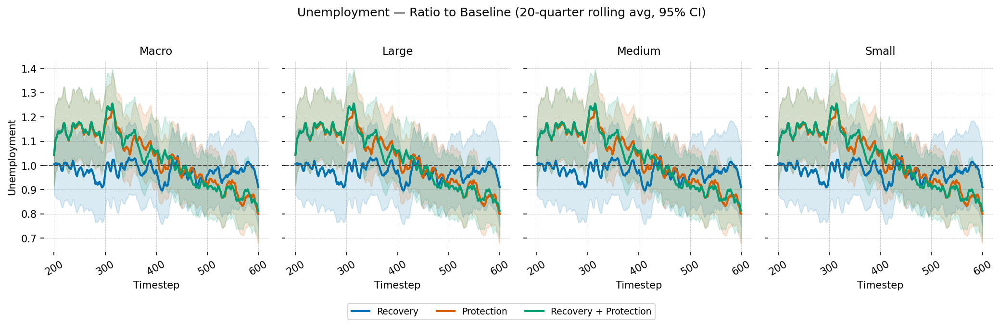

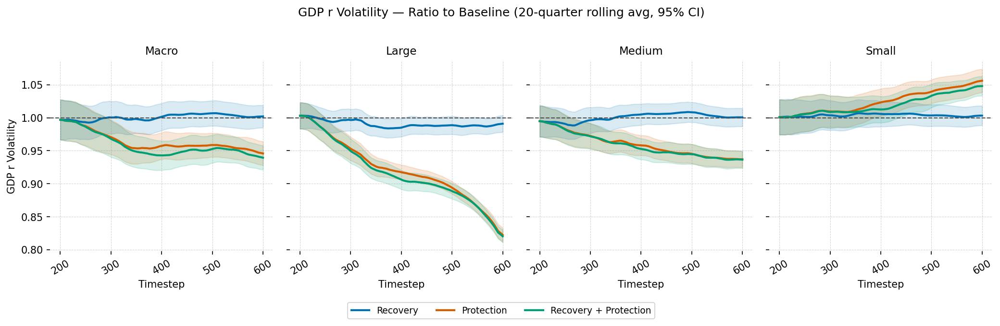

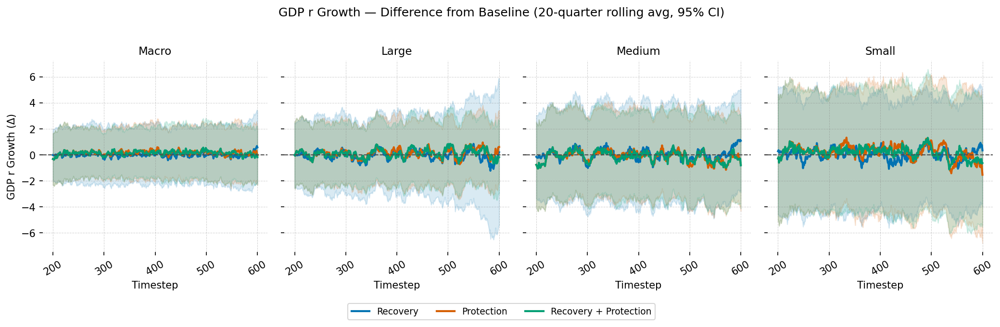

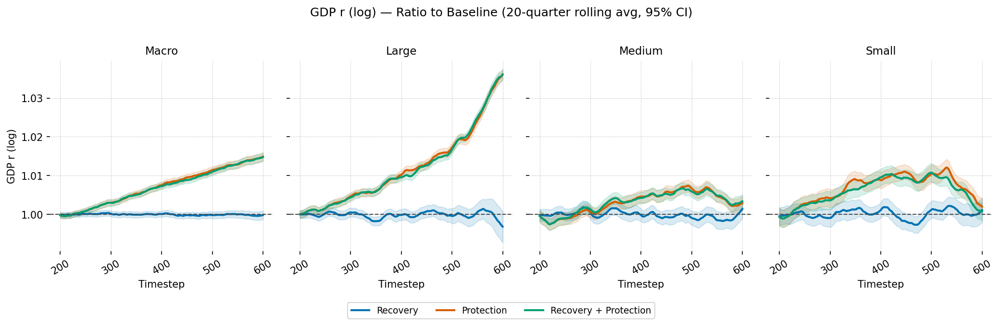

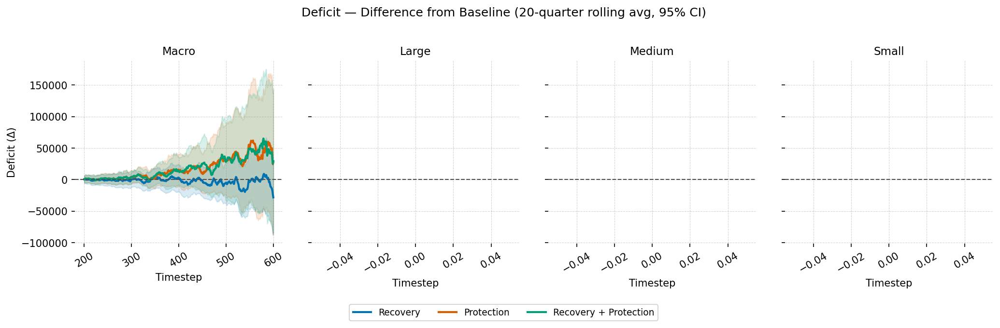

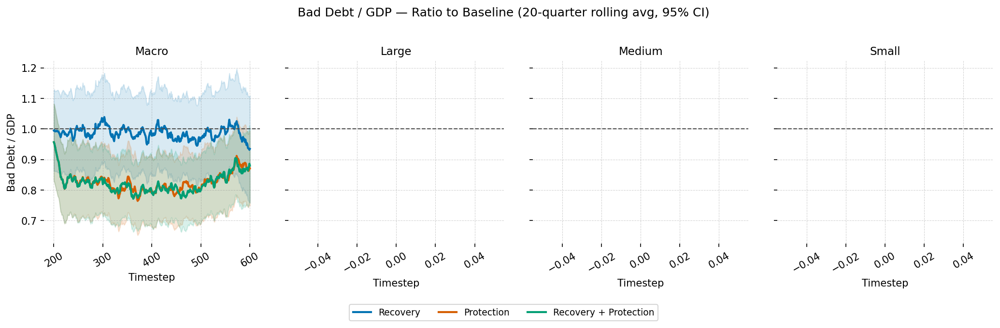

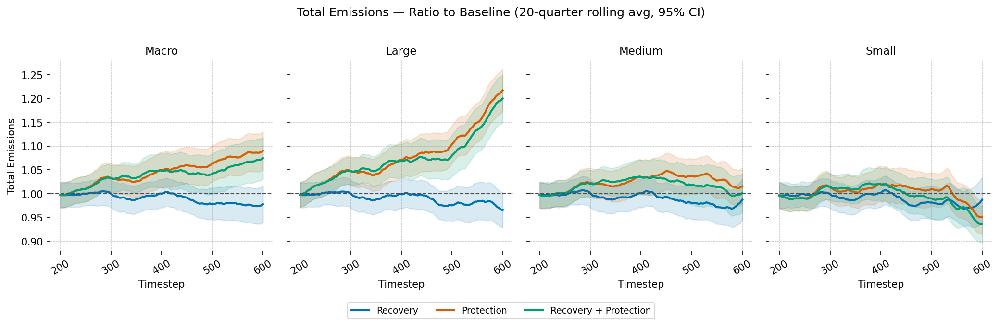

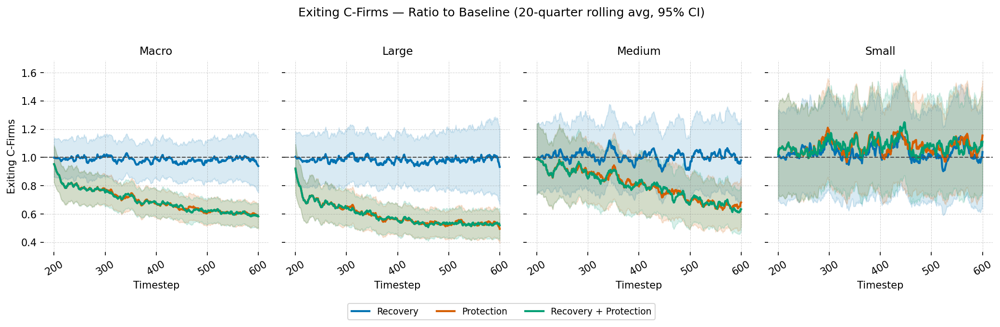

Saved 8-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/scenario_comparison.pdf


In [209]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ── Settings ────────────────────────────────────────────────────────────────
regions = ['macro', 1, 2, 3]
metrics = [
    'Unemployment',
    'GDP_r_volatility',
    'GDP_r_growth',
    'GDP_r_ln',
    'Deficit',
    'baddebt_b_over_GDP',
    'Emiss_TOT',
    'Exiting_C-Firms',
]
tmin, tmax = 200, 600
smooth_window = 20          # rolling-average window (quarters)
baseline_scenario = 'scenario_2'
comparison_scenarios = ['scenario_3', 'scenario_4', 'scenario_5']

scenario_label = {
    'scenario_3': 'Recovery',
    'scenario_4': 'Protection',
    'scenario_5': 'Recovery + Protection',
}
scenario_colors = {
    'scenario_3': '#0072B2',
    'scenario_4': '#D55E00',
    'scenario_5': '#009E73',
}
_region_title = {'macro': 'Macro', 1: 'Large', 2: 'Medium', 3: 'Small'}
_metric_label = {
    'Unemployment':       'Unemployment',
    'GDP_r_volatility':   'GDP r Volatility',
    'GDP_r_growth':       'GDP r Growth',
    'GDP_r_ln':           'GDP r (log)',
    'Deficit':            'Deficit',
    'baddebt_b_over_GDP': 'Bad Debt / GDP',
    'Emiss_TOT':          'Total Emissions',
    'Exiting_C-Firms':    'Exiting C-Firms',
}

# Signed metrics: baseline can be negative → use difference (Δ) not ratio
_signed_metrics = {'GDP_r_growth', 'Deficit'}

baseline_df_full = scenario_results[baseline_scenario]


def _make_comparison_fig(metric):
    """Build a 1×4 panel figure comparing scenarios against the baseline."""
    is_signed = metric in _signed_metrics
    fig, axes = plt.subplots(1, len(regions), figsize=(14, 4), dpi=150, sharey=True)

    for ax, region in zip(axes, regions):

        baseline_subset = baseline_df_full[
            (baseline_df_full['region'] == region) &
            (baseline_df_full['t'].between(tmin, tmax))
        ]
        baseline_t = (
            baseline_subset
            .groupby('t')[metric]
            .mean()
            .rename('baseline_mean')
        )

        for scenario_key in comparison_scenarios:
            scenario_df = scenario_results[scenario_key]
            scenario_subset = scenario_df[
                (scenario_df['region'] == region) &
                (scenario_df['t'].between(tmin, tmax))
            ]
            scenario_t = (
                scenario_subset
                .groupby('t')[metric]
                .agg(['mean', 'std', 'count'])
            )
            stats = scenario_t.join(baseline_t)

            if is_signed:
                # Difference: meaningful even when baseline is negative
                stats = stats[stats['baseline_mean'].notna()].copy()
                stats['value'] = stats['mean'] - stats['baseline_mean']
                stats['ci']    = 1.96 * stats['std'] / np.sqrt(stats['count'])
            else:
                # Ratio: guard against near-zero denominators
                # (replaces the old `> 0` filter that dropped negative periods)
                stats = stats[stats['baseline_mean'].abs() > 1e-6].copy()
                stats['value'] = stats['mean'] / stats['baseline_mean']
                stats['ci']    = (
                    (1.96 * stats['std'] / np.sqrt(stats['count']))
                    / stats['baseline_mean'].abs()
                )

            # Rolling smooth
            stats['value_s'] = (
                stats['value']
                .rolling(smooth_window, center=True, min_periods=1)
                .mean()
            )
            stats['ci_s'] = (
                stats['ci']
                .rolling(smooth_window, center=True, min_periods=1)
                .mean()
            )

            color = scenario_colors[scenario_key]
            ax.plot(
                stats.index, stats['value_s'],
                color=color, linewidth=2.0,
                label=scenario_label[scenario_key],
            )
            ax.fill_between(
                stats.index,
                stats['value_s'] - stats['ci_s'],
                stats['value_s'] + stats['ci_s'],
                color=color, alpha=0.15,
            )

        ref_value = 0.0 if is_signed else 1.0
        ax.axhline(y=ref_value, color='#4D4D4D', linestyle='--', linewidth=1.0)
        ax.set_title(_region_title.get(region, str(region)), fontsize=11)
        ax.set_xlabel('Timestep')
        ax.tick_params(axis='x', rotation=30)
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.grid(True, axis='both', alpha=0.36, color='gray',
                linestyle='--', linewidth=0.5)

    ylabel       = _metric_label[metric] + (' (Δ)' if is_signed else '')
    title_suffix = 'Difference from Baseline' if is_signed else 'Ratio to Baseline'
    axes[0].set_ylabel(ylabel)
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc='lower center', bbox_to_anchor=(0.5, -0.08),
        ncol=len(comparison_scenarios), frameon=True, fontsize=9,
    )
    fig.suptitle(
        f"{_metric_label[metric]} — {title_suffix} "
        f"({smooth_window}-quarter rolling avg, 95% CI)",
        fontsize=12, y=1.02,
    )
    plt.tight_layout()
    return fig


# ── Display + export to a single multipage PDF ──────────────────────────────
pdf_path = OUTPUT / 'scenario_comparison.pdf'
with PdfPages(pdf_path) as pdf:
    for metric in metrics:
        fig = _make_comparison_fig(metric)
        plt.show()
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)

print(f"Saved {len(metrics)}-page PDF → {pdf_path}")


## Define setup for figures

In [63]:
scenario_results.keys()

dict_keys(['scenario_1', 'scenario_2', 'scenario_3', 'scenario_4', 'scenario_5'])

In [64]:
SCENARIOS = {
    "No Shock": {"df": scenario_results["scenario_1"], "color": "#F9ECE5", 'dash': 'solid'},
    "Climate Shocks": {"df": scenario_results["scenario_2"], "color": "#D72813",'dash': 'solid'},
    "Climate Shocks + Recovery": {"df": scenario_results["scenario_3"], "color": "#0B78B3",'dash': 'solid'},
    "Climate Shocks + Protection": {"df": scenario_results["scenario_4"], "color": "#1F0062", 'dash': 'dot'},
    "Climate Shocks + Recovery + Protection": {"df": scenario_results["scenario_5"], "color": "#68150A", 'dash': 'dot'},

}

# PDF_PAGES = [
#     None,                                       # page 1: all scenarios
#     ["Small More Exposed: No Shock"],                          # page 2: dsk_sfc_1
#     ["Small More Exposed: No Shock", "Large More Exposed: No Shock"],     # page 3: dsk_sfc_1 + hrhs_1
#     ["Small More Exposed: CS"],                                # page 4: dsk_sfc_2
#     ["Small More Exposed: CS", "Large More Exposed: CS"],                 # page 5: dsk_sfc_2 + hrhs_2
#     ["Small More Exposed: LP + EF"],                           # page 6: dsk_sfc_3
#     ["Small More Exposed: LP + EF", "Large More Exposed: LP + EF"],       # page 7: dsk_sfc_3 + hrhs_3
# ]

## GDP Growth over Time

In [92]:

import pandas as pd

def rolling_smooth(series, window=20):
    """
    Centre-aligned rolling mean for ABM time series.

    Parameters
    ----------
    series : array-like
        Raw time series (cross-run mean at each time step).
    window : int
        Window width in time steps. For quarterly data 20 ≈ 5 years.
        Use 1 to disable smoothing.
    """
    return pd.Series(series).rolling(window, center=True, min_periods=1).mean().values


In [93]:
metric = "GDP_r_growth"
metric_label = 'GDP r growth'
tmin = 300
tmax = 600
smooth_window = 40    # 4 quarters = 1 year (standard annual aggregation)
# color_more = "#CC79A7"
# color_less = "#009E73"
color_less = "#CC79A7"
color_more = "#009E73"
# regions = ['macro']
regions = ['macro', 1, 2, 3]
show_no_shock = False

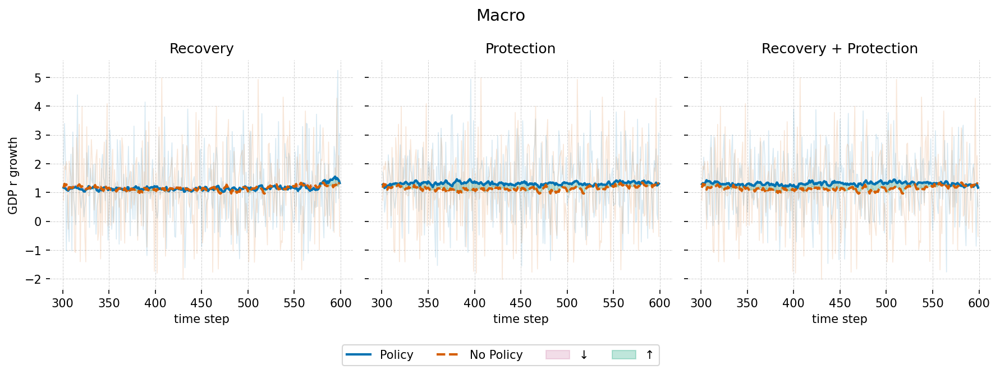

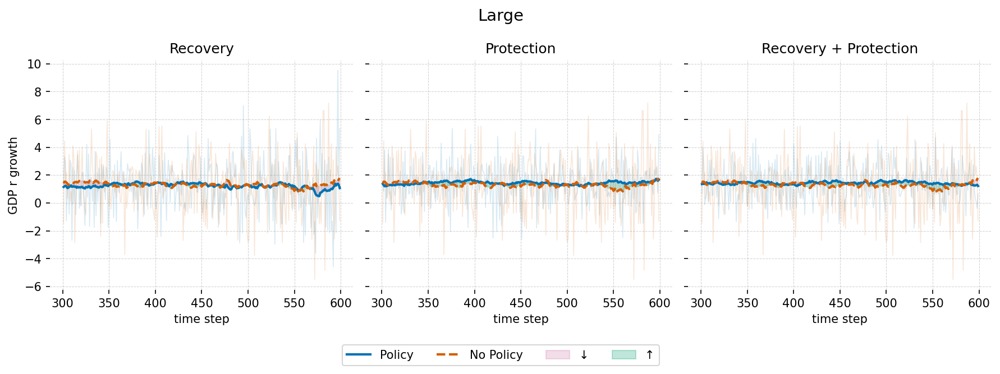

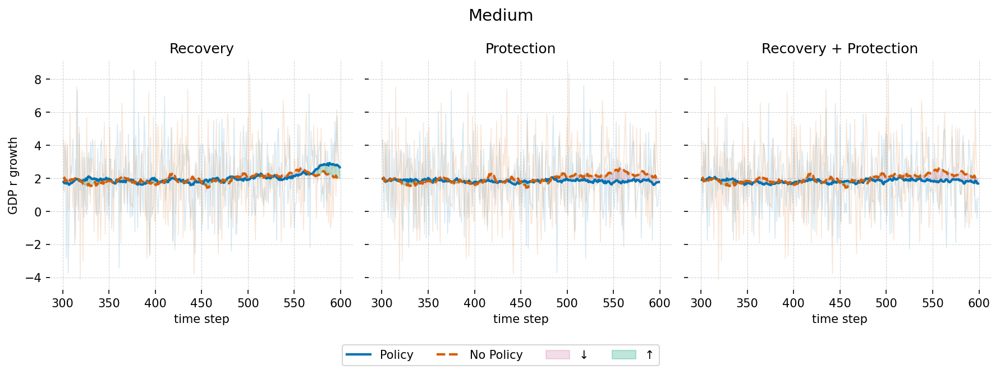

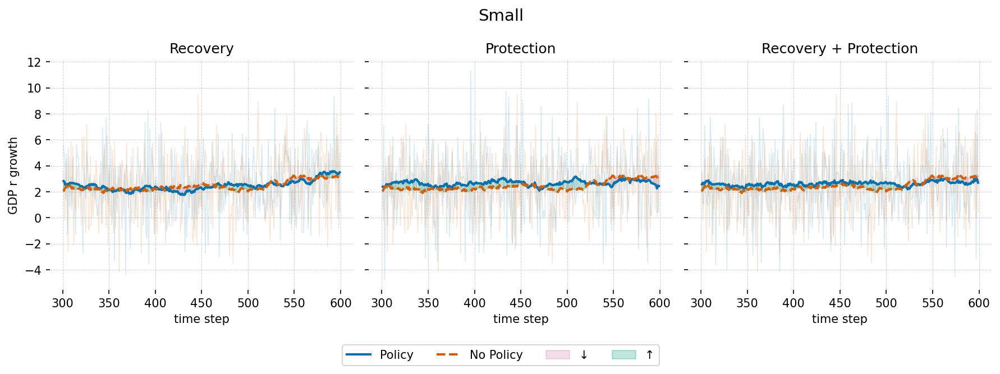

In [94]:

def _make_trend_fig(region, metric, metric_label, tmin, tmax,
                    scenario_results, smooth_window, show_no_shock,
                    color_less, color_more):
    """Build and return the 3-panel trend figure for one region."""
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), sharey=True, dpi=150)

    for idx, n in enumerate(['3', '4', '5']):
        s1 = (
            scenario_results['scenario_1']
            .loc[lambda df: df['region'] == region]
            .groupby('t')[metric].mean().reset_index()
        )
        s2 = (
            scenario_results['scenario_2']
            .loc[lambda df: df['region'] == region]
            .groupby('t')[metric].mean().reset_index()
        )
        s3 = (
            scenario_results[f'scenario_{n}']
            .loc[lambda df: df['region'] == region]
            .groupby('t')[metric].mean().reset_index()
        )

        s1.rename(columns={metric: 'No Shock'}, inplace=True)
        s2.rename(columns={metric: 'No Policy'}, inplace=True)
        if n == '3':
            s3.rename(columns={metric: 'Recovery'}, inplace=True)
            scenario_label = 'Recovery'
        elif n == '4':
            s3.rename(columns={metric: 'Protection'}, inplace=True)
            scenario_label = 'Protection'
        elif n == '5':
            s3.rename(columns={metric: 'Protection + Recovery'}, inplace=True)
            scenario_label = 'Protection + Recovery'

        df = pd.merge(s1, s2, on='t')
        df = pd.merge(df, s3, on='t')
        df['t'] = df['t'].astype(int)
        df = df[(df['t'] > tmin) & (df['t'] < tmax)].copy()

        smooth_cols = [scenario_label, 'No Policy'] + (['No Shock'] if show_no_shock else [])
        for col in smooth_cols:
            df[f'{col}_raw'] = df[col]
            df[col] = rolling_smooth(df[col].values, window=smooth_window)

        ax = axes[idx]

        ax.plot(df['t'], df[f'{scenario_label}_raw'], color='#0072B2', alpha=0.15, linewidth=0.8)
        ax.plot(df['t'], df['No Policy_raw'],         color='#D55E00', alpha=0.15, linewidth=0.8)
        if show_no_shock:
            ax.plot(df['t'], df['No Shock_raw'], color='#4D4D4D', alpha=0.15, linewidth=0.8)

        ax.plot(df['t'], df[scenario_label], color='#0072B2', linewidth=2.0, label='Policy')
        ax.plot(df['t'], df['No Policy'],    color='#D55E00', linestyle='--', linewidth=2.0, label='No Policy')
        if show_no_shock:
            ax.plot(df['t'], df['No Shock'], color='#4D4D4D', linestyle='--', linewidth=2.0, label='No Shock')

        ax.fill_between(
            df['t'], df['No Policy'], df[scenario_label],
            where=(df['No Policy'] > df[scenario_label]),
            interpolate=True, color=color_less, alpha=0.25,
            label='↓' if idx == 0 else None,
        )
        ax.fill_between(
            df['t'], df['No Policy'], df[scenario_label],
            where=(df['No Policy'] <= df[scenario_label]),
            interpolate=True, color=color_more, alpha=0.25,
            label='↑' if idx == 0 else None,
        )

        ax.set_xlabel('time step')
        ax.set_title({'3': 'Recovery', '4': 'Protection', '5': 'Recovery + Protection'}[n])

    region_title = {'macro': 'Macro', 1: 'Large', 2: 'Medium', 3: 'Small'}.get(region, str(region))
    fig.suptitle(region_title, fontsize=14)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=5, frameon=True)
    axes[0].set_ylabel(metric_label)

    for ax in axes:
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.grid(True, axis='both', alpha=0.36, color='gray', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    return fig


# --- Display one figure per region ---
for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [95]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"

with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)

print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/GDP_r_growth_trends.pdf


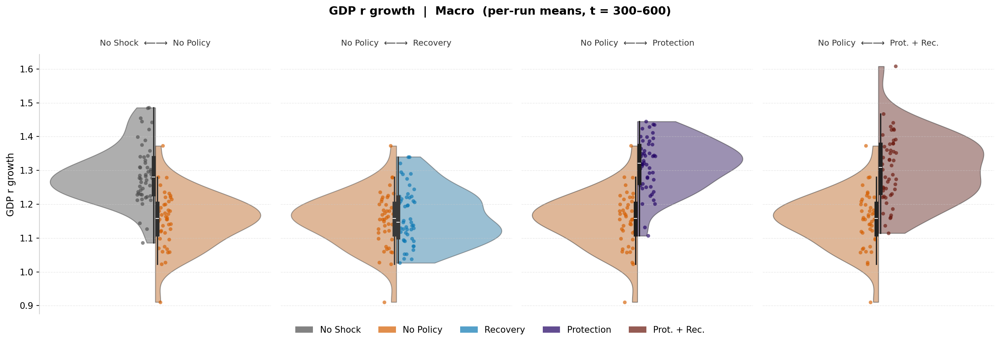

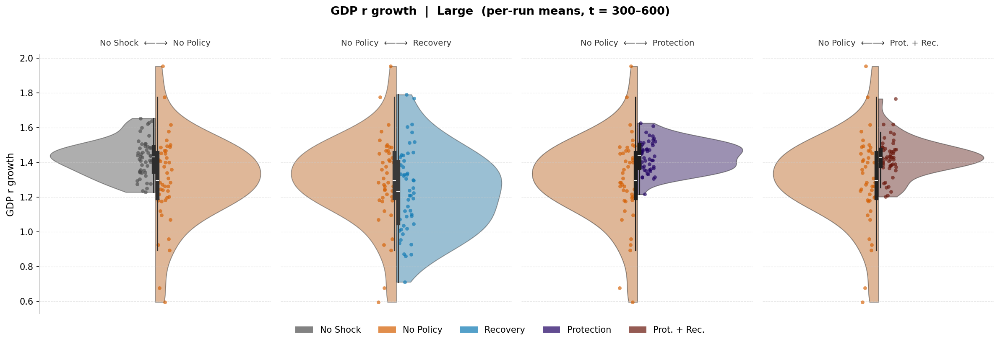

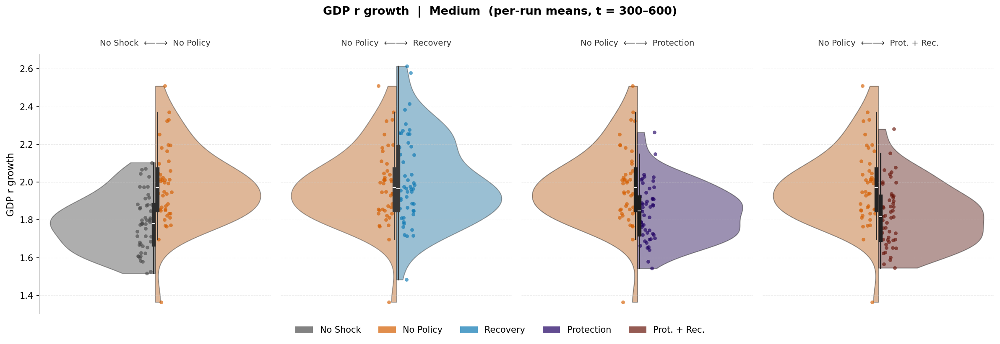

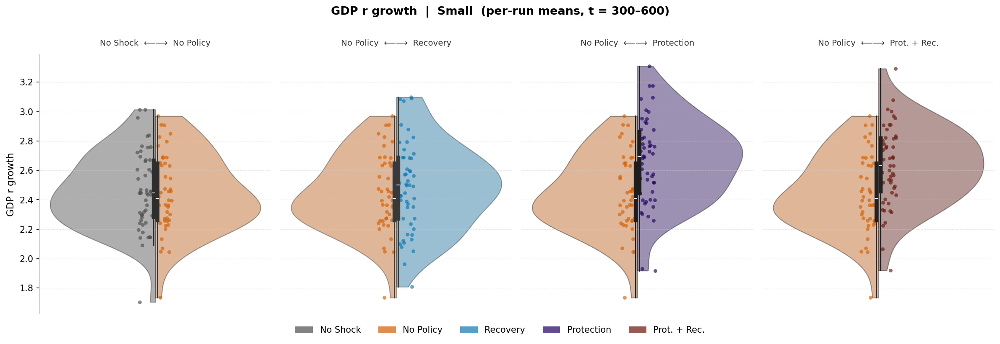

In [96]:

from matplotlib.patches import Patch
from matplotlib.collections import PolyCollection
import numpy as np

# Consistent scenario colours (matching SCENARIOS dict)
_colors = {
    'No Shock':     '#4D4D4D',
    'No Policy':    '#D55E00',
    'Recovery':     '#0B78B3',
    'Protection':   '#1F0062',
    'Prot. + Rec.': '#68150A',
}

_jitter_max = 0.07
_jitter_min = 0.01


def _make_violin_fig(region, metric, metric_label, tmin, tmax,
                     scenario_results, rng_seed=42):
    """Build and return the 4-panel split violin figure for one region."""
    _rng = np.random.default_rng(rng_seed)

    def run_means(scenario_key):
        return (
            scenario_results[scenario_key]
            .loc[lambda df: (df['region'] == region) & (df['t'] > tmin) & (df['t'] < tmax)]
            .groupby('run')[metric]
            .mean()
            .reset_index()
        )

    rm = {i: run_means(f'scenario_{i}') for i in range(1, 6)}

    comparisons = [
        ('No Shock',  'No Policy',    rm[1], rm[2]),
        ('No Policy', 'Recovery',     rm[2], rm[3]),
        ('No Policy', 'Protection',   rm[2], rm[4]),
        ('No Policy', 'Prot. + Rec.', rm[2], rm[5]),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(16, 5), sharey=True, dpi=150)
    fig.patch.set_facecolor('white')

    for ax_idx, (ax, (label_a, label_b, df_a, df_b)) in enumerate(zip(axes, comparisons)):

        comp_a = df_a[[metric]].copy(); comp_a['Group'] = label_a; comp_a['_x'] = ''
        comp_b = df_b[[metric]].copy(); comp_b['Group'] = label_b; comp_b['_x'] = ''
        plot_df = pd.concat([comp_a, comp_b], ignore_index=True)

        sns.violinplot(
            data=plot_df, x='_x', y=metric,
            hue='Group', hue_order=[label_a, label_b],
            palette={label_a: _colors[label_a], label_b: _colors[label_b]},
            split=True, inner='box', fill=True, cut=0, linewidth=1.0, ax=ax,
        )

        for coll in ax.collections:
            if isinstance(coll, PolyCollection):
                coll.set_alpha(0.45)

        n_a, n_b = len(df_a), len(df_b)
        x_a = -_rng.uniform(_jitter_min, _jitter_max, size=n_a)
        x_b =  _rng.uniform(_jitter_min, _jitter_max, size=n_b)
        ax.scatter(x_a, df_a[metric].values,
                   color=_colors[label_a], s=18, alpha=0.65, linewidths=0, zorder=4)
        ax.scatter(x_b, df_b[metric].values,
                   color=_colors[label_b], s=18, alpha=0.65, linewidths=0, zorder=4)

        for line in ax.lines:
            line.set_zorder(5)

        ax.set_title(f"{label_a}  ⟵⟶  {label_b}", fontsize=9.5, pad=10, color='#333333')
        ax.set_xlabel(''); ax.set_xticks([])
        ax.set_ylabel(metric_label if ax_idx == 0 else '', fontsize=11)
        if ax_idx > 0:
            ax.tick_params(axis='y', labelleft=False, length=0)
        if ax.get_legend():
            ax.get_legend().remove()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        if ax_idx == 0:
            ax.spines['left'].set_color('#cccccc')
            ax.spines['left'].set_linewidth(0.8)
        else:
            ax.spines['left'].set_visible(False)
        ax.set_facecolor('white')
        ax.grid(True, axis='y', alpha=0.45, color='#cccccc', linestyle='--', linewidth=0.6)

    region_title = {'macro': 'Macro', 1: 'Large', 2: 'Medium', 3: 'Small'}.get(region, str(region))
    fig.suptitle(
        f"{metric_label}  |  {region_title}  (per-run means, t = {tmin}–{tmax})",
        fontsize=13, fontweight='bold', y=1.01,
    )
    legend_handles = [Patch(facecolor=c, alpha=0.7, label=lbl) for lbl, c in _colors.items()]
    fig.legend(handles=legend_handles, loc='lower center', bbox_to_anchor=(0.5, -0.06),
               ncol=5, frameon=False, fontsize=10)
    plt.tight_layout()
    return fig


# --- Display one figure per region ---
for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [97]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"

with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)

print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/GDP_r_growth_violins.pdf


## Unemployment

In [98]:
metric = "Unemployment"
metric_label = 'Unemployment'
tmin = 200
tmax = 600
smooth_window = 20    # 4 quarters = 1 year (standard annual aggregation)
color_more = "#CC79A7"
color_less = "#009E73"
# regions = ['macro']
regions = ['macro', 1, 2, 3]
show_no_shock = False

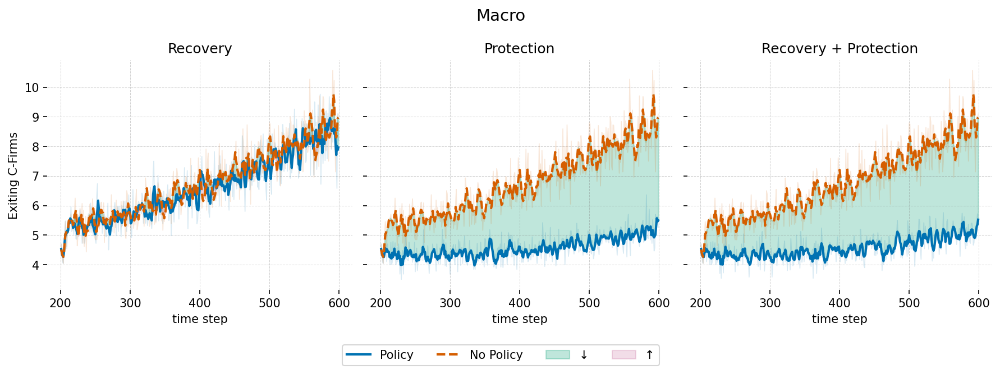

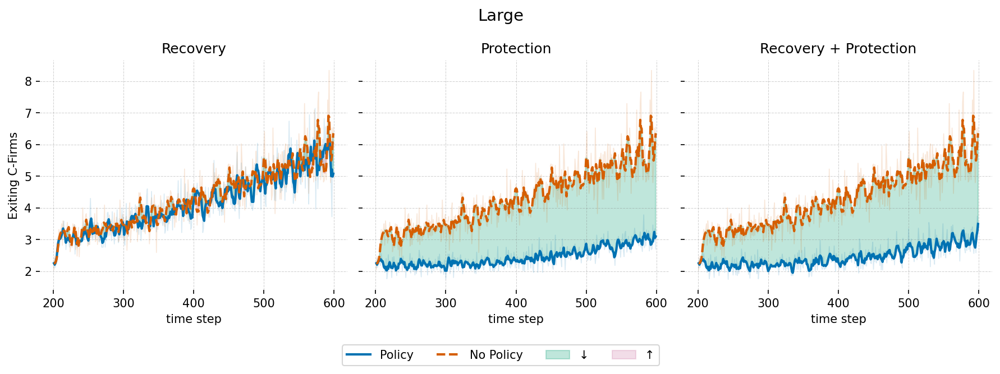

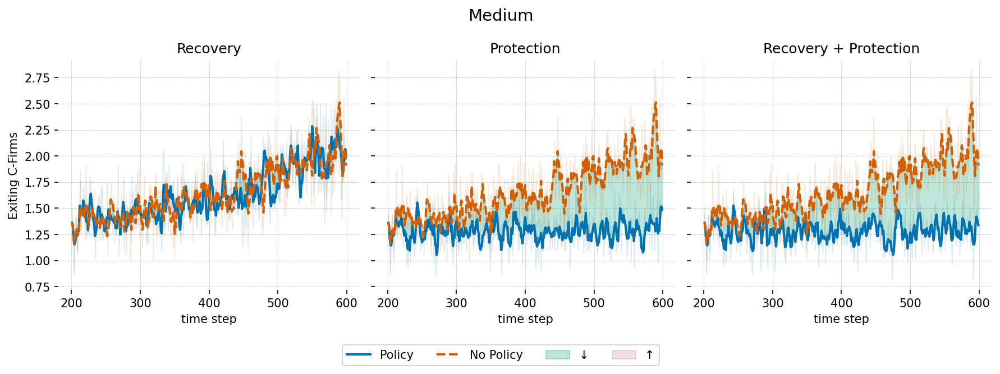

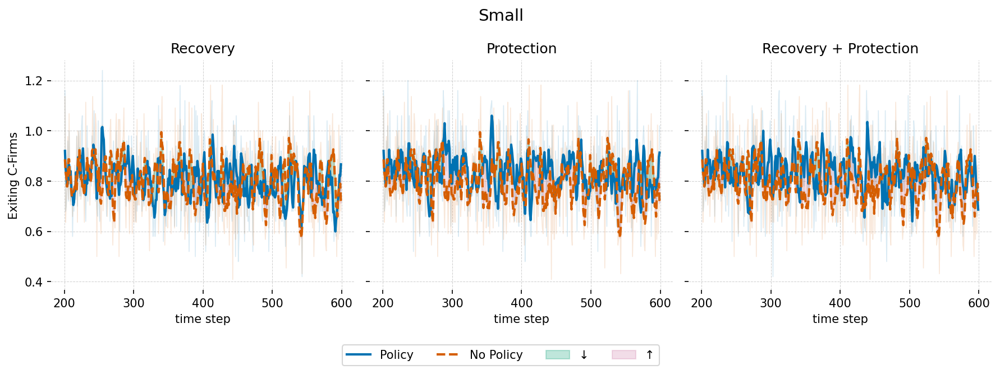

In [161]:

for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [162]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Exiting_C-Firms_trends.pdf


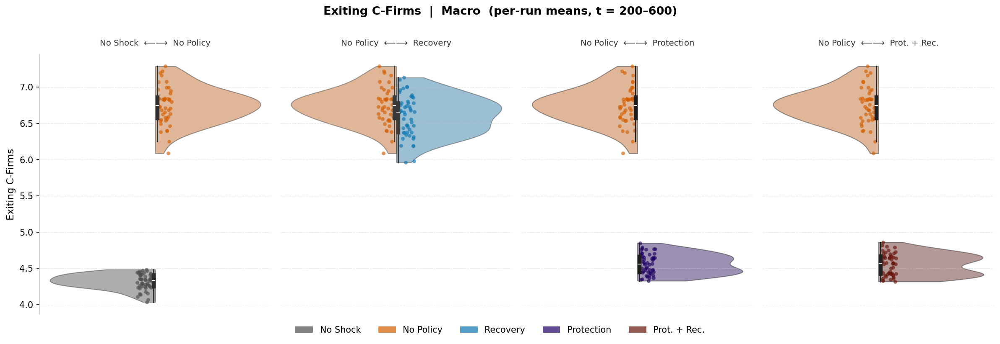

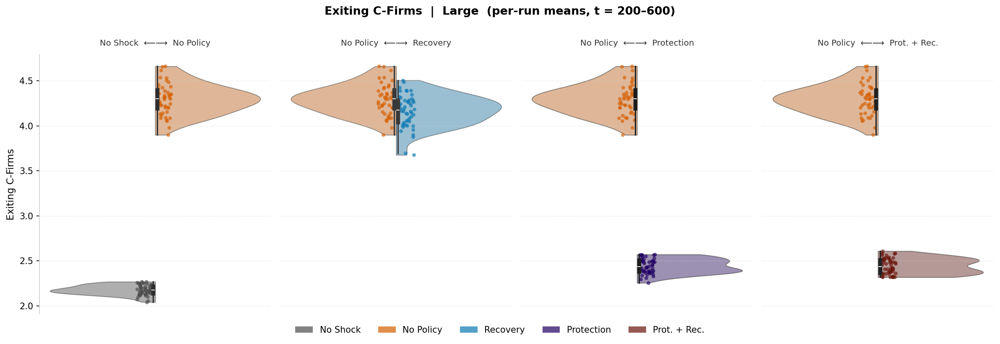

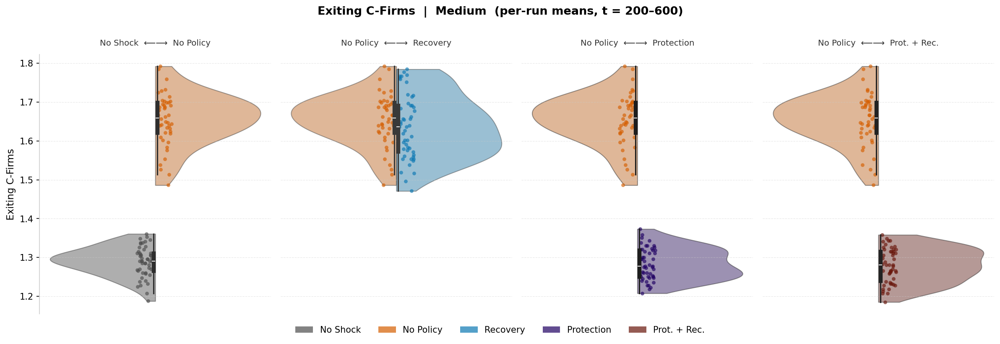

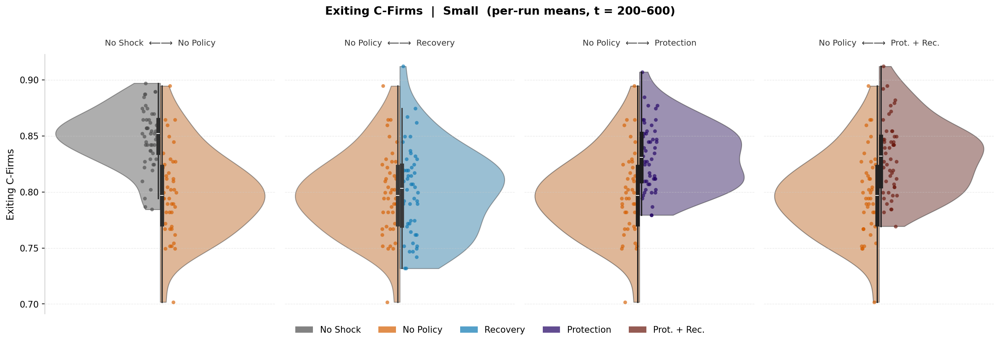

In [163]:

for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [102]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Unemployment_violins.pdf


## Deficit

In [103]:
metric = "Deficit"
metric_label = 'Deficit'
tmin = 200
tmax = 600
smooth_window = 4    # 4 quarters = 1 year (standard annual aggregation)
color_more = "#CC79A7"
color_less = "#009E73"
regions = ['macro']
# regions = ['macro', 1, 2, 3]
show_no_shock = False

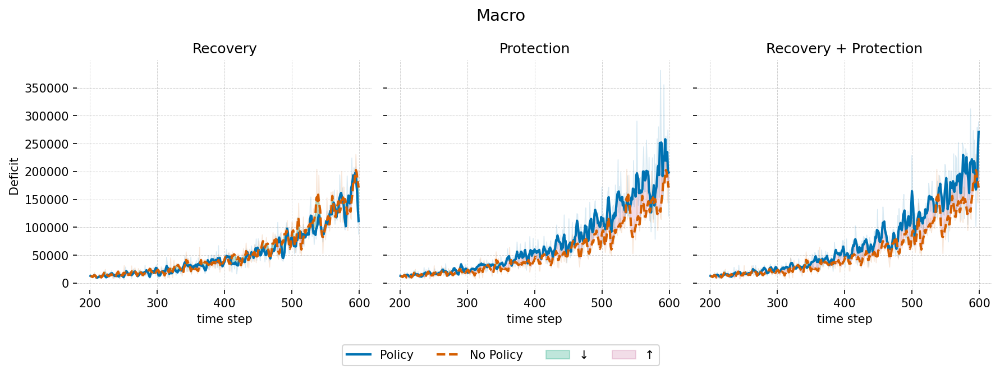

In [104]:

for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [105]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Deficit_trends.pdf


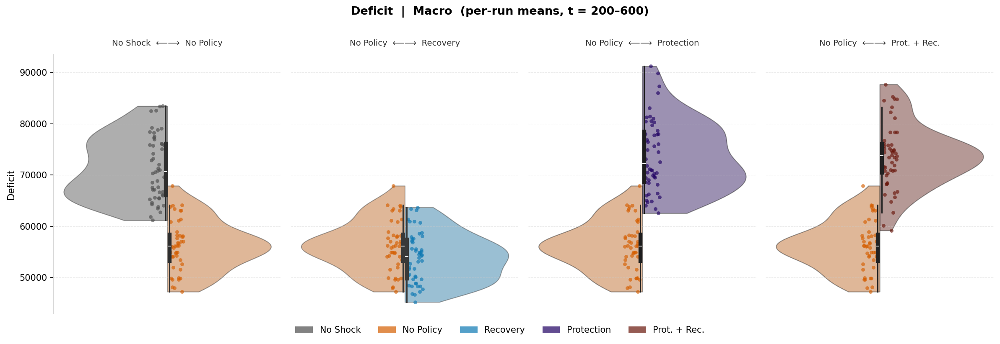

In [106]:

for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [107]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Deficit_violins.pdf


## Bad debt

In [108]:
metric = "baddebt_b_over_GDP"
metric_label = 'Bad Debt / GDP'
tmin = 200
tmax = 600
smooth_window = 20    # 4 quarters = 1 year (standard annual aggregation)
color_more = "#CC79A7"
color_less = "#009E73"
regions = ['macro']
# regions = ['macro', 1, 2, 3]
show_no_shock = False

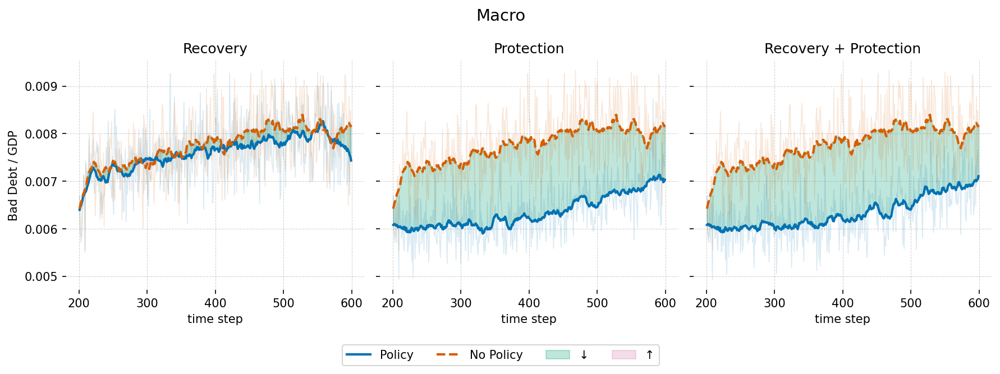

In [109]:

for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [110]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/baddebt_b_over_GDP_trends.pdf


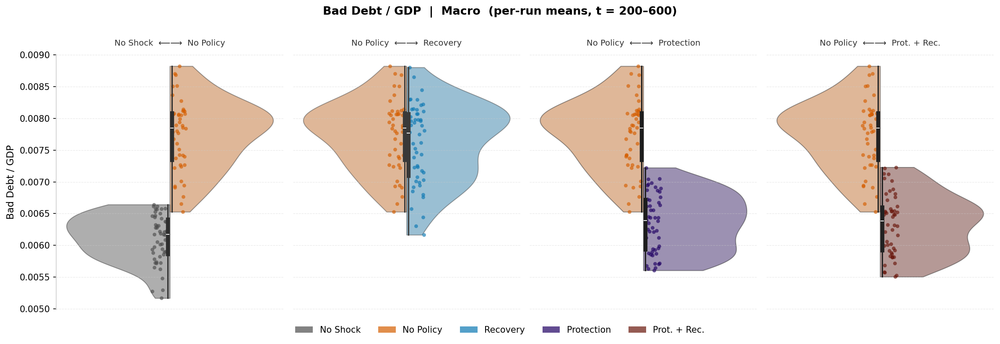

In [111]:

for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [112]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/baddebt_b_over_GDP_violins.pdf


## Emissions

In [113]:
metric = "Emiss_TOT"
metric_label = 'Total Emissions'
tmin = 200
tmax = 600
smooth_window = 4    # 4 quarters = 1 year (standard annual aggregation)
color_more = "#CC79A7"
color_less = "#009E73"
regions = ['macro']
# regions = ['macro', 1, 2, 3]
show_no_shock = False

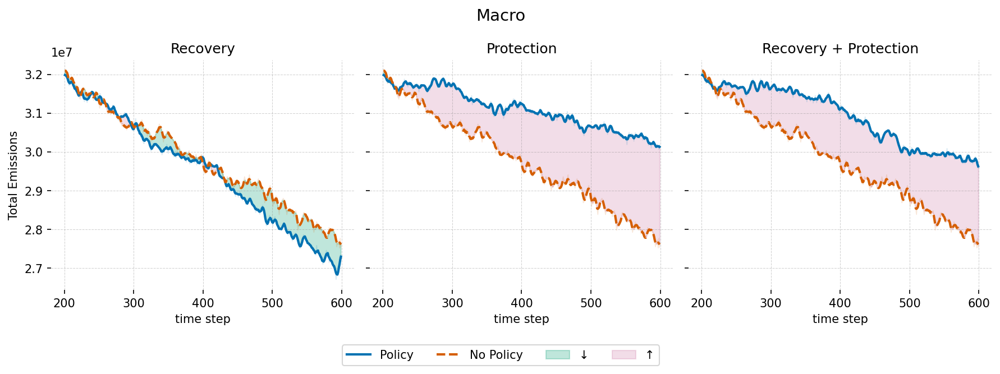

In [114]:

for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [115]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Emiss_TOT_trends.pdf


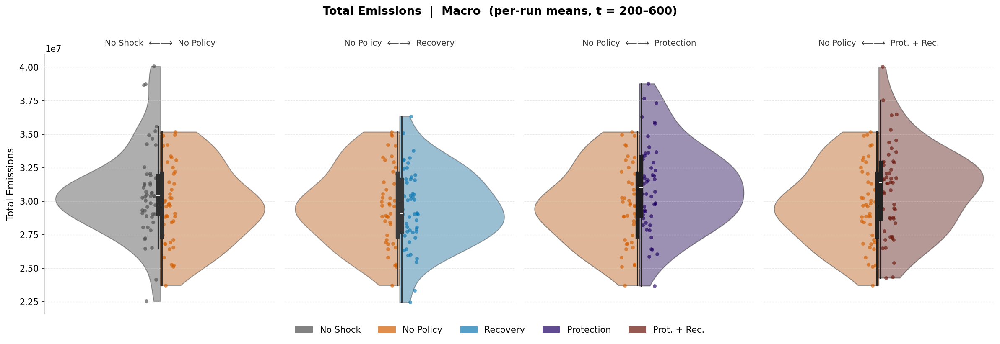

In [116]:

for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [117]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 1-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Emiss_TOT_violins.pdf


## Exiting C- Firms Failure

In [118]:
metric = "Exiting_C-Firms"
metric_label = 'Exiting C-Firms'
tmin = 200
tmax = 600
smooth_window = 4    # 4 quarters = 1 year (standard annual aggregation)
color_more = "#CC79A7"
color_less = "#009E73"
# regions = ['macro']
regions = ['macro', 1, 2, 3]
show_no_shock = False

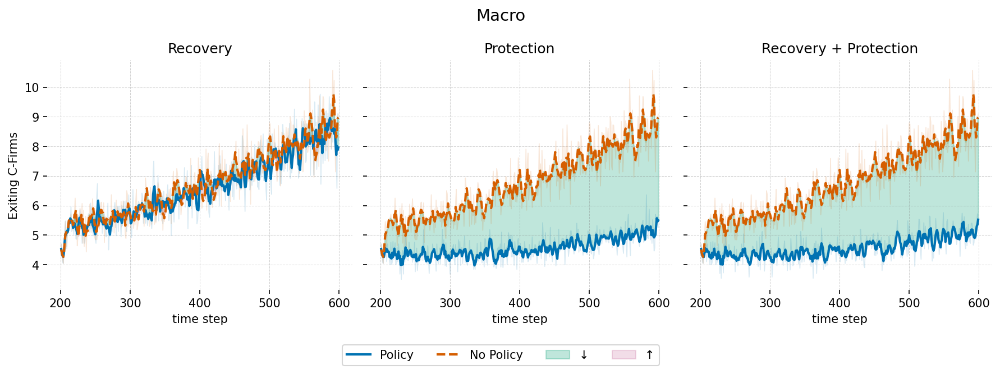

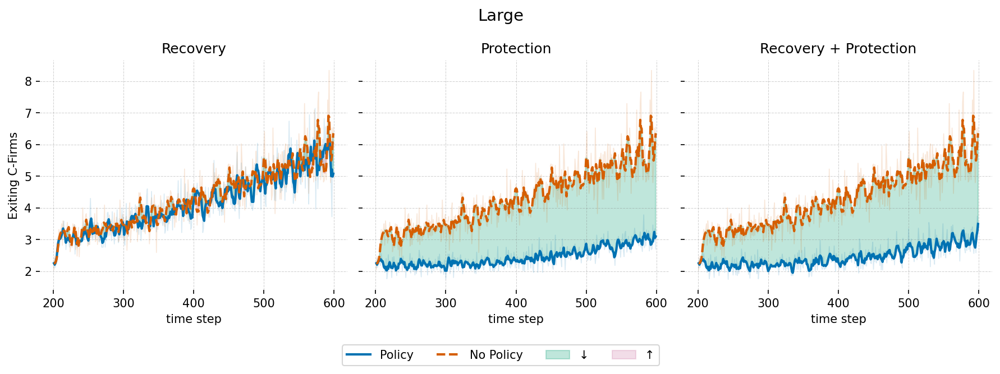

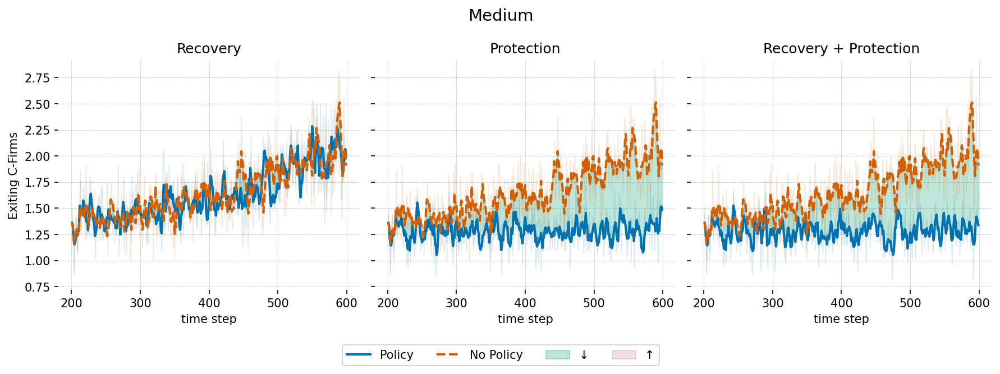

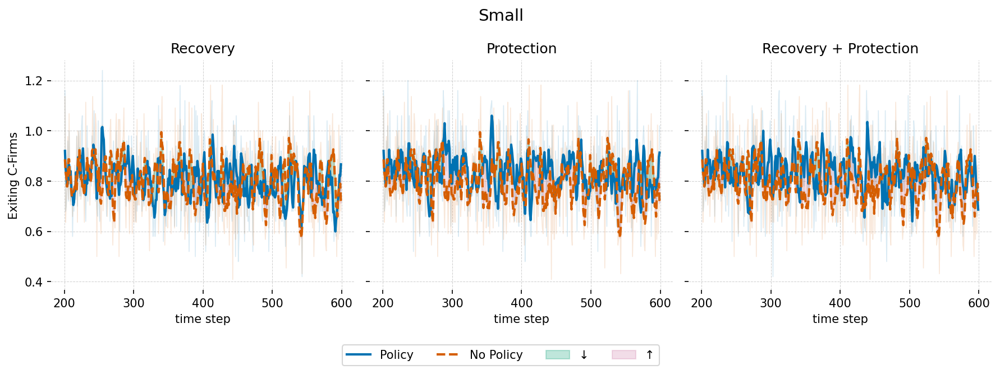

In [119]:

for region in regions:
    fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                          scenario_results, smooth_window, show_no_shock,
                          color_less, color_more)
    plt.show()
    plt.close(fig)


In [120]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_trends.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_trend_fig(region, metric, metric_label, tmin, tmax,
                              scenario_results, smooth_window, show_no_shock,
                              color_less, color_more)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Exiting_C-Firms_trends.pdf


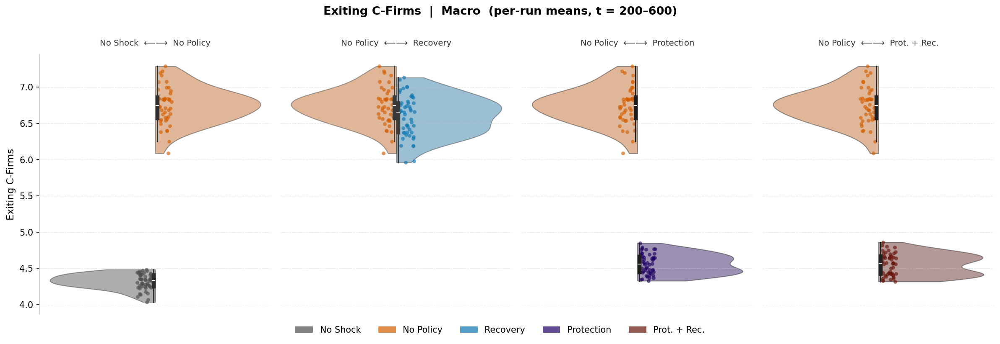

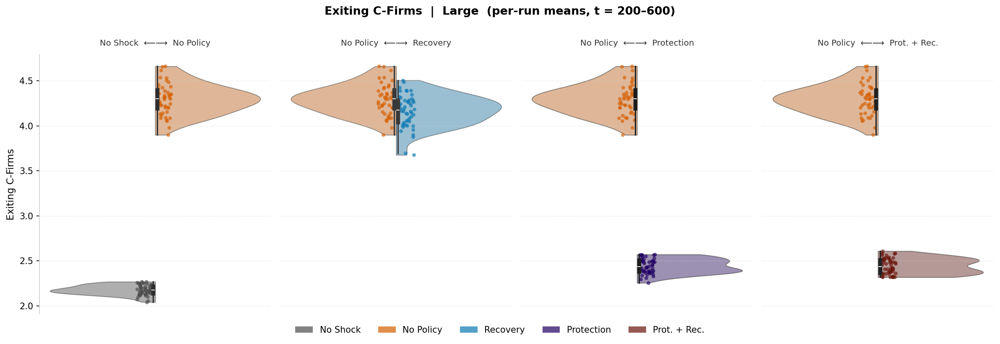

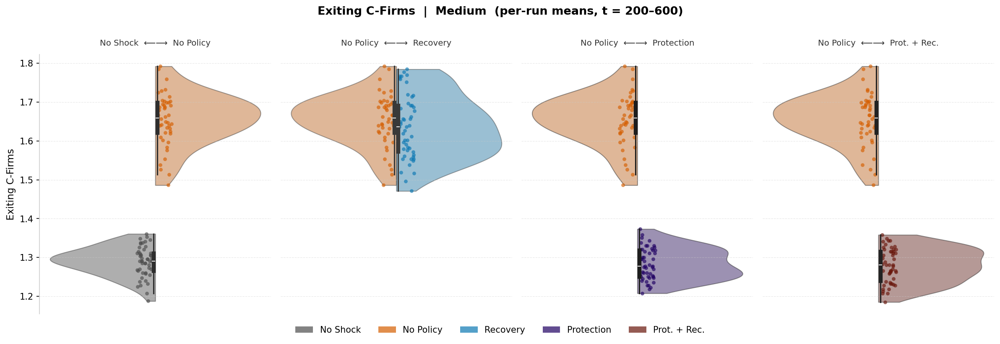

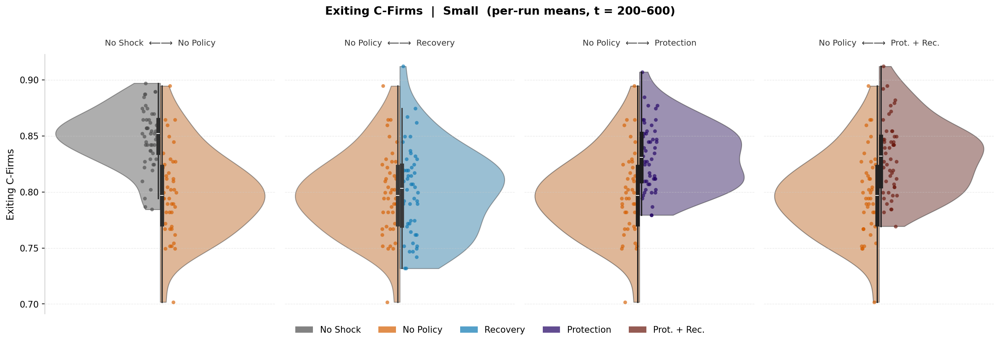

In [121]:

for region in regions:
    fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
    plt.show()
    plt.close(fig)


In [122]:

from matplotlib.backends.backend_pdf import PdfPages

pdf_path = OUTPUT / f"{metric}_violins.pdf"
with PdfPages(pdf_path) as pdf:
    for region in regions:
        fig = _make_violin_fig(region, metric, metric_label, tmin, tmax, scenario_results)
        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)
print(f"Saved {len(regions)}-page PDF → {pdf_path}")


Saved 4-page PDF → /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/Exiting_C-Firms_violins.pdf


## Market share of C firms

In [123]:
scenario_results['scenario_1']

,t,GDP_r,Consumption_r,Investment_r,EmploymentRate,cpi,cpi_rel,Am,Deficit,GB,...,X_b_6,X_a_7,X_b_7,X_a_8,X_b_8,X_a_9,X_b_9,Unemployment,GDP_r_volatility,GDP_r_ln
0,1,252594.545500,222954.545500,29640.0,0.997900,1.2535,0.9948,0.916700,838.2575,310838.2575,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.210000,NaN,12.439541
1,2,246682.874000,218520.727800,21000.0,0.979100,1.2801,1.0212,0.916700,-558.9863,310279.2712,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.090000,NaN,12.415859
2,3,227266.671200,208431.485800,7600.0,0.904700,1.2924,1.0096,0.917000,7361.8502,317641.1214,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.530000,13.378333,12.333879
3,4,214309.115500,201424.385800,4080.0,0.852000,1.2806,0.9909,0.917200,12705.5541,330346.6755,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.800000,9.563436,12.275175
4,5,206593.142500,198082.652400,3760.0,0.820700,1.2653,0.9880,0.917400,14972.6091,345319.2846,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.930000,8.306517,12.238507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119995,596,214362.301857,182268.504537,10600.0,0.967068,NaN,NaN,4.188212,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.293190,17.064412,12.275423
119996,597,216250.212570,184131.484335,14640.0,0.973534,NaN,NaN,4.149410,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.646629,17.050142,12.284191
119997,598,225756.734831,187698.177075,17000.0,0.996472,NaN,NaN,4.120117,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.352762,17.049125,12.327213
119998,599,237306.152695,196095.651987,18440.0,0.989155,NaN,NaN,4.072516,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.084518,17.053934,12.377106


In [124]:
df = scenario_results['scenario_1']

df_ls = df.groupby(["t", "region"])['LS'].mean().explode().reset_index()

df_ls.region = df_ls.region.replace(region_index)

In [125]:

# --- Prepare data ---
df_anim = df_ls[df_ls["region"] != "macro"].copy()

# Relative change from t=1 (%)
ls_t1 = df_anim[df_anim["t"] == 1].set_index("region")["LS"]
df_anim["LS_rel"] = df_anim.apply(lambda r: (r["LS"] / ls_t1[r["region"]] - 1) * 100, axis=1)

# Sample at t=1 and every 50 steps up to t=600
df_anim = df_anim[((df_anim["t"] == 1) | (df_anim["t"] % 50 == 0)) & (df_anim["t"] <= 600)].copy()
df_anim["t_str"] = df_anim["t"].astype(str)

# Region display order and colours from region_meta
region_order = list(region_meta.keys())   # ["L", "M", "S"]
region_names  = [region_meta[r]["name"]  for r in region_order]
region_colors = [region_meta[r]["color"] for r in region_order]

time_steps = sorted(df_anim["t"].unique())

# --- Build frames ---
def _bar_traces(t_val):
    sub = df_anim[df_anim["t"] == t_val].set_index("region")
    traces = []
    for reg, meta in region_meta.items():
        val = float(sub.loc[reg, "LS_rel"]) if reg in sub.index else 0.0
        traces.append(go.Bar(
            x=[meta["name"]],
            y=[val],
            name=meta["name"],
            marker_color=meta["color"],
            showlegend=False,
            text=[f"{val:+.2f}%"],
            textposition="outside",
        ))
    return traces

init_traces = _bar_traces(time_steps[0])

frames = [
    go.Frame(
        data=_bar_traces(t),
        name=str(t),
        layout=go.Layout(title_text=f"Labour Supply – relative change from t=1  |  t = {t}"),
    )
    for t in time_steps
]

fig = go.Figure(data=init_traces, frames=frames)

fig.update_layout(
    title=dict(
        text=f"Labour Supply – relative change from t=1  |  t = {time_steps[0]}",
        font=dict(size=15),
    ),
    plot_bgcolor="white",
    paper_bgcolor="white",
    width=600, height=460,
    barmode="group",
    yaxis=dict(
        title="ΔLS vs t=1 (%)",
        showgrid=True, gridcolor="lightgray",
        zeroline=True, zerolinecolor="black", zerolinewidth=1,
        range=[-25, 25],
    ),
    xaxis=dict(title="Region", showgrid=False),
    margin=dict(t=80, b=120),
    updatemenus=[{
        "buttons": [
            {"args": [None, {"frame": {"duration": 800, "redraw": True}, "fromcurrent": True}],
             "label": "▶ Play", "method": "animate"},
            {"args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}],
             "label": "⏸ Pause", "method": "animate"},
        ],
        "direction": "left", "showactive": False, "type": "buttons",
        "x": 0.08, "y": -0.15, "xanchor": "right",
    }],
    sliders=[{
        "steps": [
            {"args": [[str(t)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
             "label": str(t), "method": "animate"}
            for t in time_steps
        ],
        "x": 0.1, "len": 0.85, "y": -0.08,
        "currentvalue": {"prefix": "t = ", "visible": True, "xanchor": "center", "font": {"size": 13}},
        "transition": {"duration": 0},
    }],
)

fig.show()
fig.write_html(str(OUTPUT / "italy_ls_animation.html"), include_plotlyjs="cdn")
print(f"Saved to {OUTPUT / 'italy_ls_animation.html'}")


Saved to /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_ls_animation.html


In [126]:

from matplotlib.colors import to_hex

# Color / name mapping consistent with the rest of the notebook
# to_hex() converts the RGBA tuple from cmap(i) to a "#rrggbb" hex string
# that is accepted by both Plotly and the hex-parsing in plot_shock_magnitude.
region_meta = {
    "L": {"name": "Large", "color": to_hex(cmap(0))},
    "M": {"name": "Medium", "color": to_hex(cmap(1))},
    "S": {"name": "Small",    "color": to_hex(cmap(2))},
}

x = np.linspace(1e-4, 0.15, 500)   # damage fraction [0%, 15%]

# Prepare data
df_b = df_shocks[df_shocks["region"] != "macro"].copy()
time_steps = sorted(df_b["t"].unique())

sampled_ts = [t for t in time_steps if 200 <= t <= 600 and t % 50 == 0]

# channels: 1=heatwave, 6=flood
channels = [
    ("Heatwave",    "X_a_1", "X_b_1"),
    ("Floods", "X_a_6", "X_b_6"),
]

# --- Compute per-channel y-axis ceiling ---
y_max_per_channel = [0.0, 0.0]
for t_val in sampled_ts:
    df_t = df_b[df_b["t"] == t_val].set_index("region")
    for ci, (_, a_col, b_col) in enumerate(channels):
        for reg in region_meta:
            if reg not in df_t.index:
                continue
            pdf_vals = beta_dist.pdf(x, float(df_t.loc[reg, a_col]), float(df_t.loc[reg, b_col]))
            y_max_per_channel[ci] = max(y_max_per_channel[ci], pdf_vals.max())

y_range_1 = [0, y_max_per_channel[0] * 1.05]   # 5 % headroom for channel 0
y_range_2 = [0, y_max_per_channel[1] * 1.05]   # 5 % headroom for channel 1

def _pdf_traces(t_val):
    df_t = df_b[df_b["t"] == t_val].set_index("region")
    traces = []
    for ci, (_, a_col, b_col) in enumerate(channels):
        for reg, meta in region_meta.items():
            if reg not in df_t.index:
                continue
            a_v = float(df_t.loc[reg, a_col])
            b_v = float(df_t.loc[reg, b_col])
            pdf = beta_dist.pdf(x, a_v, b_v)
            traces.append(go.Scatter(
                x=x, y=pdf, mode="lines",
                name=f"{reg} - {meta['name']}",
                line=dict(color=meta["color"], width=2),
                legendgroup=reg,
                showlegend=(ci == 0),
                xaxis="x"  if ci == 0 else "x2",
                yaxis="y"  if ci == 0 else "y2",
            ))
    return traces

init_traces = _pdf_traces(sampled_ts[0])

frames = [
    go.Frame(
        data=_pdf_traces(t),
        name=str(t),
        layout=go.Layout(title_text=f"Beta Damage Distributions - t = {t}"),
    )
    for t in sampled_ts
]

fig = go.Figure(data=init_traces, frames=frames)

_axis_common = dict(showgrid=True, gridcolor="lightgray", gridwidth=1, zeroline=False)

fig.update_layout(
    title=dict(
        text=f"Beta Damage Distributions - t = {sampled_ts[0]}",
        font=dict(size=16),
    ),
    plot_bgcolor="white",
    width=1100, height=520,
    xaxis=dict(domain=[0, 0.44], title="Damage fraction", tickformat=".0%", range=[0, 0.15], **_axis_common),
    yaxis=dict(title="Probability density", range=y_range_1, fixedrange=True, **_axis_common),
    xaxis2=dict(domain=[0.56, 1.0], title="Damage fraction", tickformat=".0%", range=[0, 0.15], anchor="y2", **_axis_common),
    yaxis2=dict(title="Probability density", anchor="x2", range=y_range_2, fixedrange=True, **_axis_common),
    annotations=[
        dict(text="<b>Heatwave</b>",    x=0.22, y=1.08, xref="paper", yref="paper", showarrow=False, font=dict(size=14)),
        dict(text="<b>Floods</b>", x=0.78, y=1.08, xref="paper", yref="paper", showarrow=False, font=dict(size=14)),
    ],
    legend=dict(orientation="h", yanchor="bottom", y=-0.55, xanchor="center", x=0.5, font=dict(size=11)),
    updatemenus=[{
        "buttons": [
            {"args": [None, {"frame": {"duration": 600, "redraw": True}, "fromcurrent": True}],
             "label": "Play", "method": "animate"},
            {"args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}],
             "label": "Pause", "method": "animate"},
        ],
        "direction": "left", "showactive": False, "type": "buttons",
        "x": 0.08, "y": -0.13, "xanchor": "right",
    }],
    sliders=[{
        "steps": [
            {"args": [[str(t)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
             "label": str(t), "method": "animate"}
            for t in sampled_ts
        ],
        "x": 0.1, "len": 0.85, "y": -0.07,
        "currentvalue": {"prefix": "t = ", "visible": True, "xanchor": "center", "font": {"size": 13}},
        "transition": {"duration": 0},
    }],
    margin=dict(t=80, b=140),
)

fig.show()
fig.write_html(str(OUTPUT / "italy_beta_evolution.html"), include_plotlyjs="cdn")
print(f"Saved to {OUTPUT / 'italy_beta_evolution.html'}")


Saved to /Users/anmolsoni/Nextcloud/projects/Regionalised-SFC-DSK/figures/Italy/italy_beta_evolution.html
